In [1]:
import os
import numpy as np
from plantcv import plantcv as pcv

In [2]:
import matplotlib
matplotlib.rcParams['image.interpolation'] = "nearest"
matplotlib.rcParams['figure.figsize'] = [4.4, 2.8]

In [3]:
pcv.params.debug = "plot"
pcv.params.dpi = 300

In [4]:
# Store data filename Tray 1
scandirtray_1 = "/external/sentinel_share/users/grace/LemnaTec/vnir/2022-05-24/2022-05-24__11-45-17-924"
imgnametray_1 = "1992e4e9-4c8f-4331-b23b-39264f18185b_data"
filepathtray_1 = os.path.join(scandirtray_1, imgnametray_1)

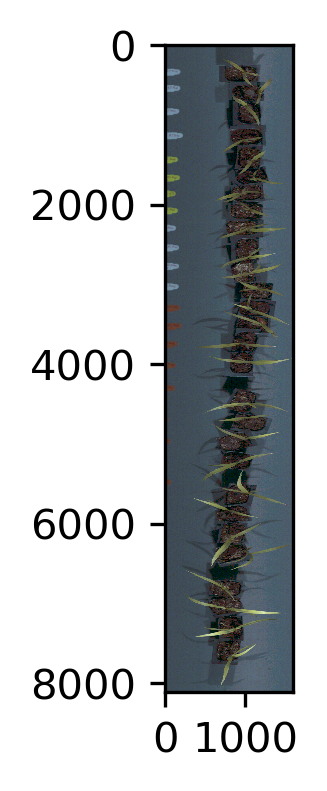

In [5]:
# Read in the hyperspectral data
psent_tray_1 = pcv.readimage(filename=filepathtray_1, mode="envi")

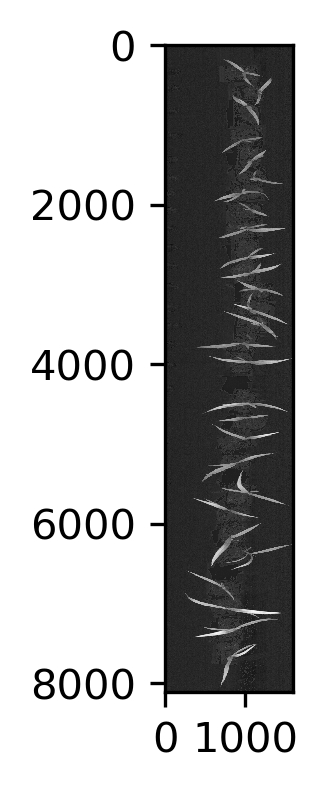

In [6]:
# Soil Adjusted Vegetation Index [Huete et al. (1988)]
savitray_1 = pcv.spectral_index.savi(hsi=psent_tray_1, distance = 5)

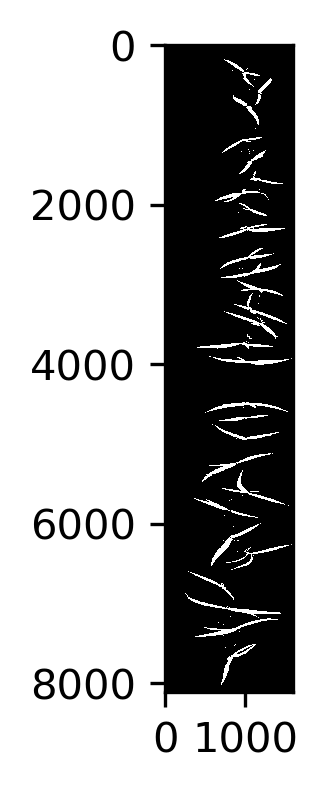

In [7]:
savitray_1_thresh = pcv.threshold.binary(gray_img=savitray_1.array_data, threshold=0.18, max_value=255)

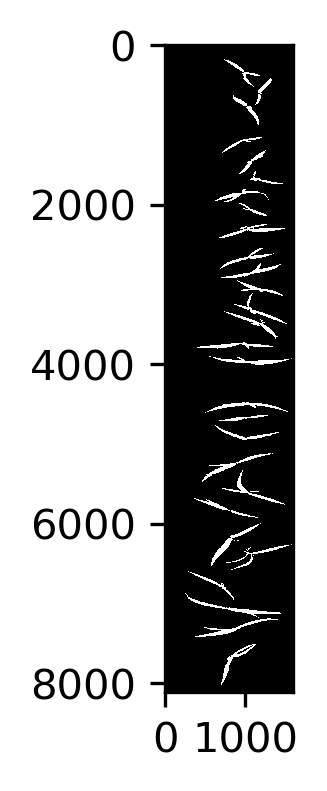

In [8]:
fill_savitray_1_thresh = pcv.fill(savitray_1_thresh, 1000)

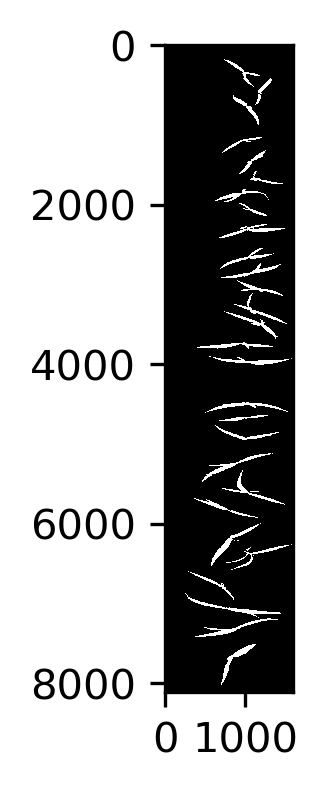

In [9]:
fill_imagetray_1 = pcv.fill_holes(fill_savitray_1_thresh)

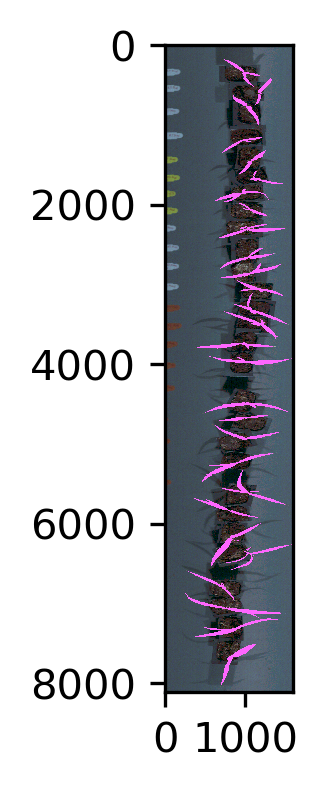

In [10]:
id_objects, obj_hierarchy = pcv.find_objects(psent_tray_1.pseudo_rgb, fill_imagetray_1)

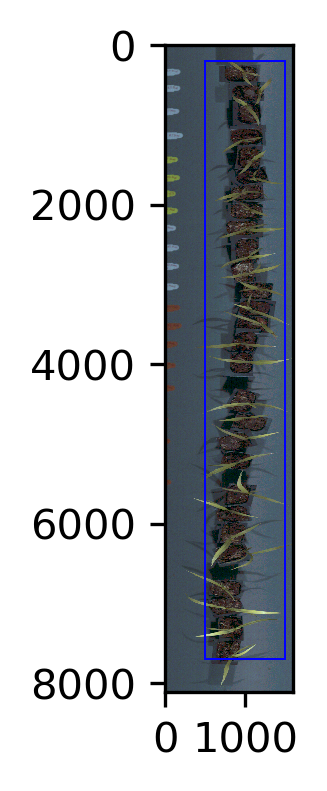

In [11]:
# Healthy mock leaf over the infiltration area
pcv.params.line_thickness = 30

roi1, roi_hierarchy1= pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=500, y=200, h=7500, w=1000)

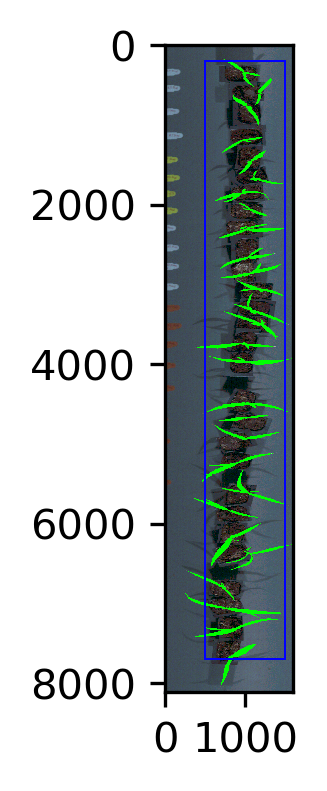

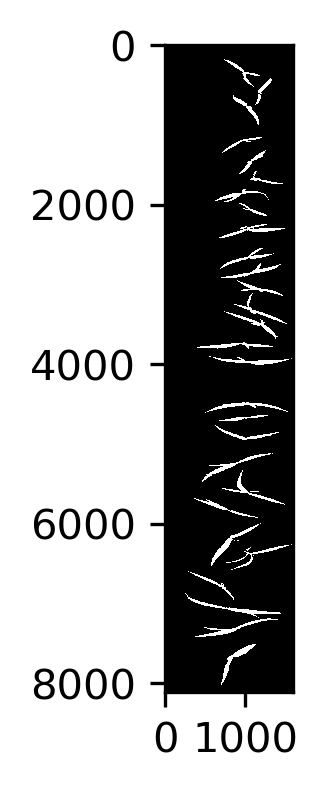

In [12]:
roi_objects1, hierarchy1, kept_mask1, obj_area1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb, roi_contour=roi1, 
                                                               roi_hierarchy=roi_hierarchy1, 
                                                               object_contour=id_objects, 
                                                               obj_hierarchy=obj_hierarchy,
                                                               roi_type='partial')

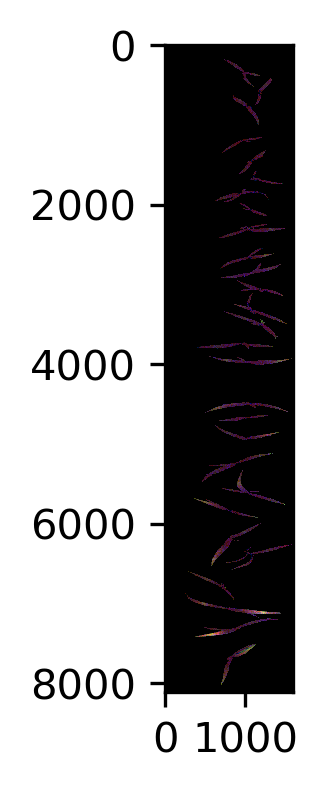

In [13]:
psent_tray_1.array_data = pcv.apply_mask(img=psent_tray_1.array_data, mask=kept_mask1, mask_color="black")

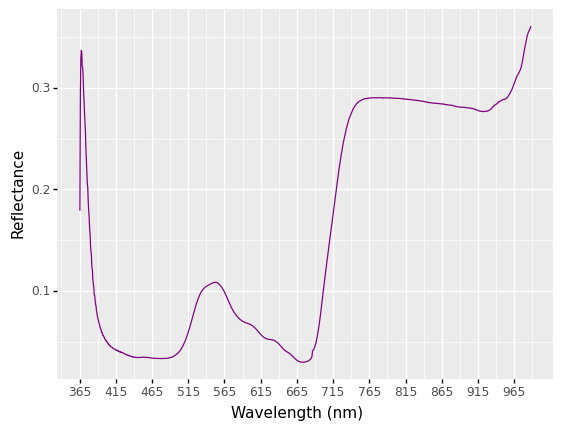

In [14]:
pcv.outputs.clear()
pcv.params.debug='plot'

psent_166_tray1 = pcv.hyperspectral.analyze_spectral(array=psent_tray_1, mask=kept_mask1, histplot=True)

In [58]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/DEX_TA_DSP_setaria_reflectance.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


/shares/mgehan_share/lacosta-gamboa/plantcv/plantcv/plantcv/spectral_index/spectral_index.py:154: RuntimeWarning: divide by zero encountered in true_divide
/shares/mgehan_share/lacosta-gamboa/plantcv/plantcv/plantcv/spectral_index/spectral_index.py:154: RuntimeWarning: invalid value encountered in subtract


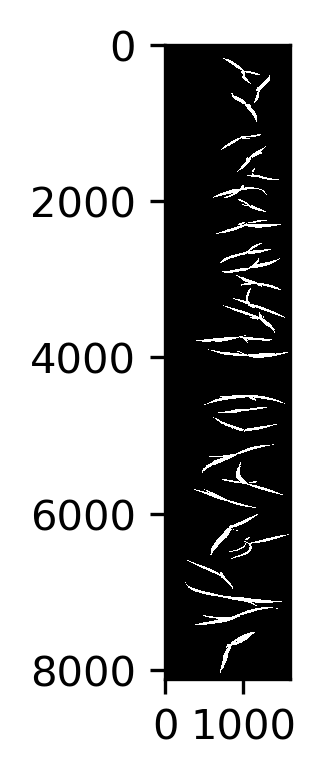

In [15]:
# ARI
ari_psent_tray_1 = pcv.spectral_index.ari(hsi=psent_tray_1, distance = 5)

In [16]:
ari_psent_tray_1_grayscale = ari_psent_tray_1.array_data

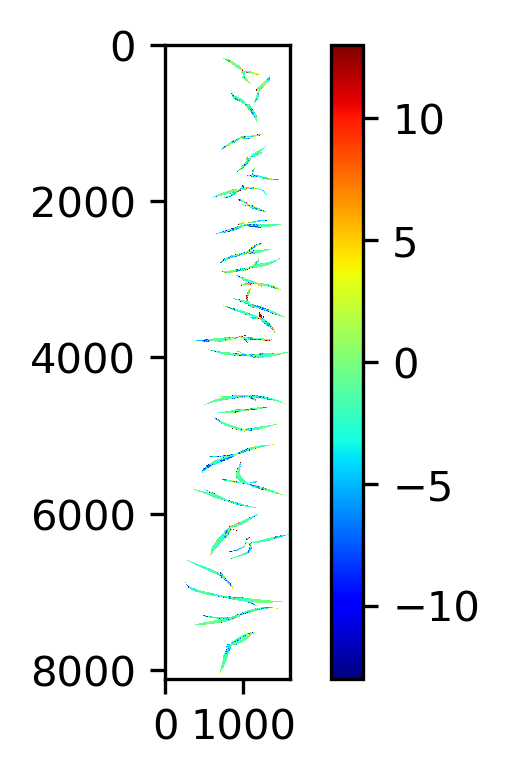

In [17]:
pseudo_ari_psent_tray_1 = pcv.visualize.pseudocolor(gray_img = ari_psent_tray_1_grayscale, mask=kept_mask1, cmap='jet', 
                                           min_value=-13, max_value=13)

In [67]:
pcv.print_image(pseudo_ari_psent_tray_1, "/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/DEX_TA_DSP_setaria_reflectance.svg")

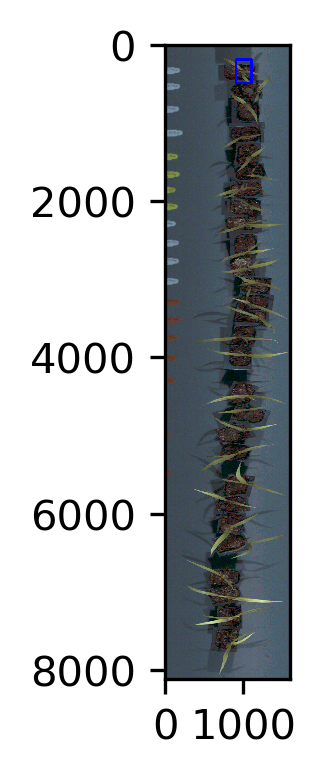

In [103]:
# Healthy mock leaf over the infiltration area
pcv.params.line_thickness = 30

roi_psent167_1_1, roi_hierarchy_psent167_1_1 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=900, y=200, h=300, w=200)

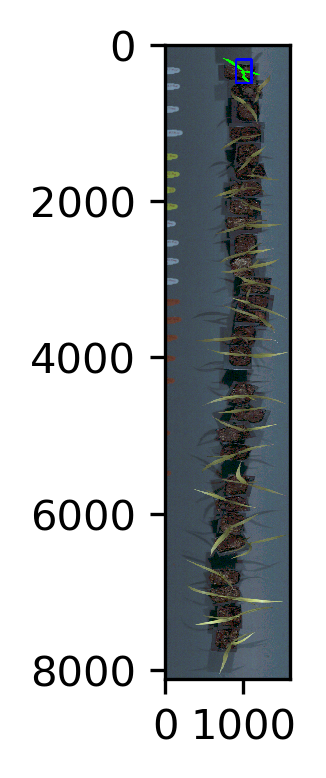

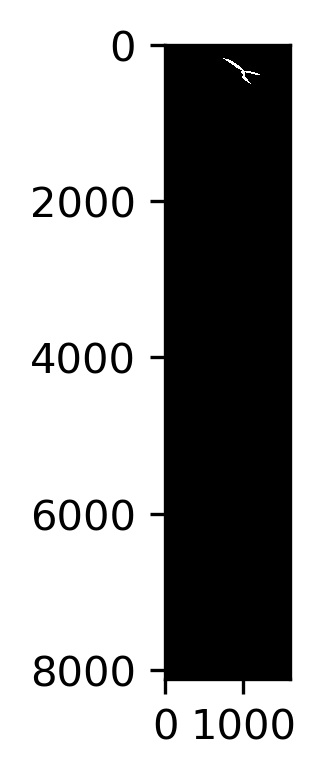

In [104]:
roi_objects_psent167_1_1, hierarchy_psent167_1_1, kept_mask_psent167_1_1, obj_area_psent167_1_1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_1_1,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_1_1,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-10.924273, 39.10636] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


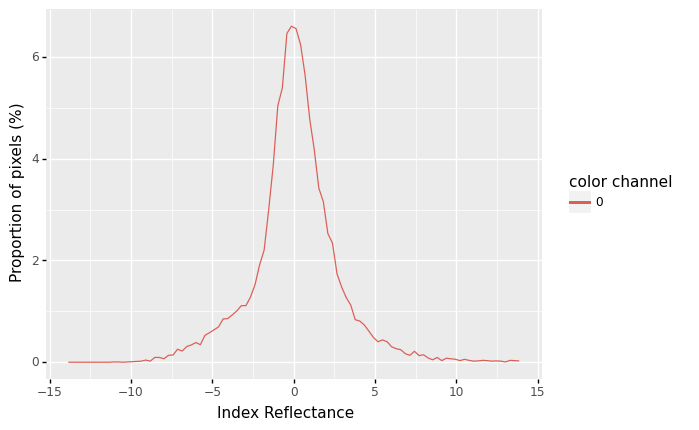

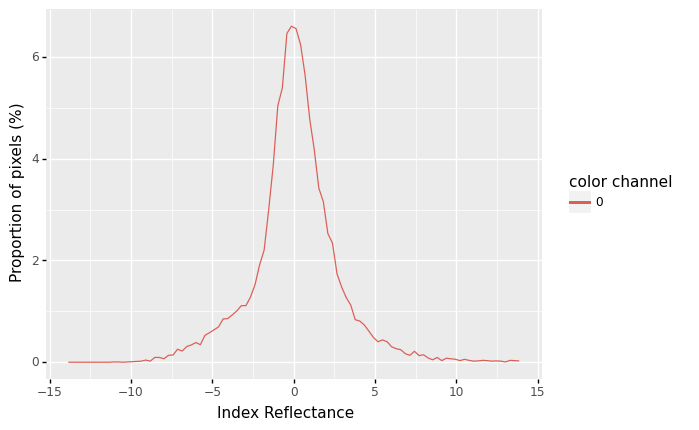

<ggplot: (2982799774913)>

In [105]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_1_1, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [106]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


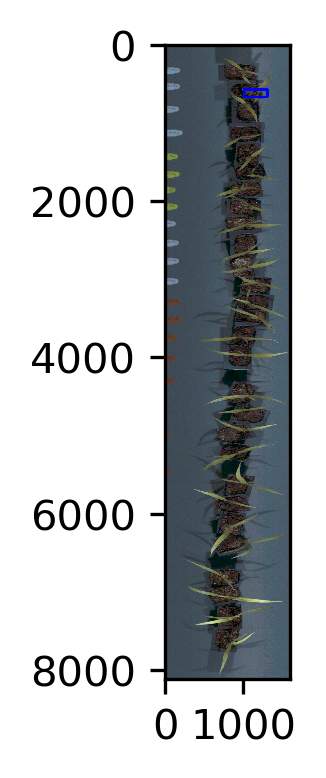

In [107]:
# Healthy mock leaf over the infiltration area
pcv.params.line_thickness = 30

roi_psent167_2_1, roi_hierarchy_psent167_2_1 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=580, h=100, w=300)

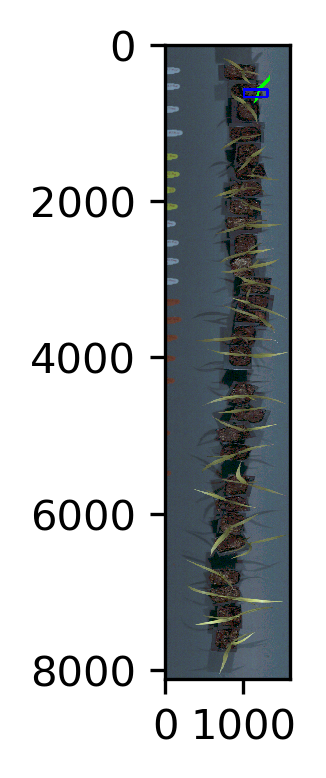

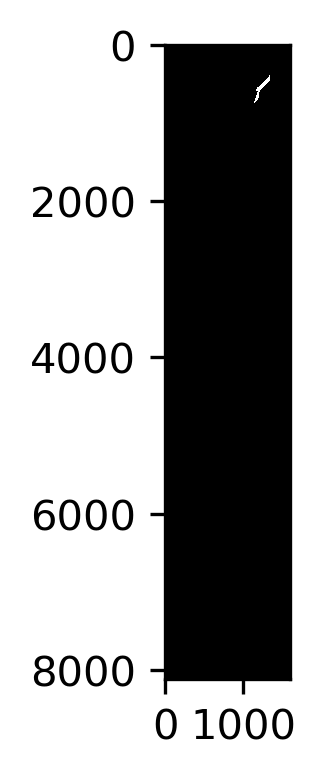

In [108]:
roi_objects_psent167_2_1, hierarchy_psent167_2_1, kept_mask_psent167_2_1, obj_area_psent167_2_1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_2_1,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_2_1,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-14.298372, 83.882355] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


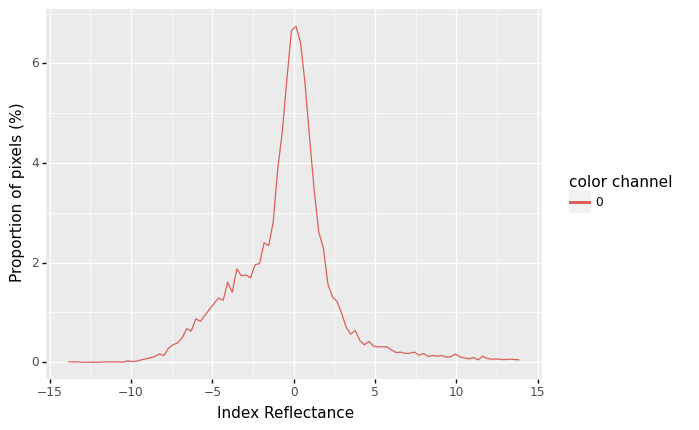

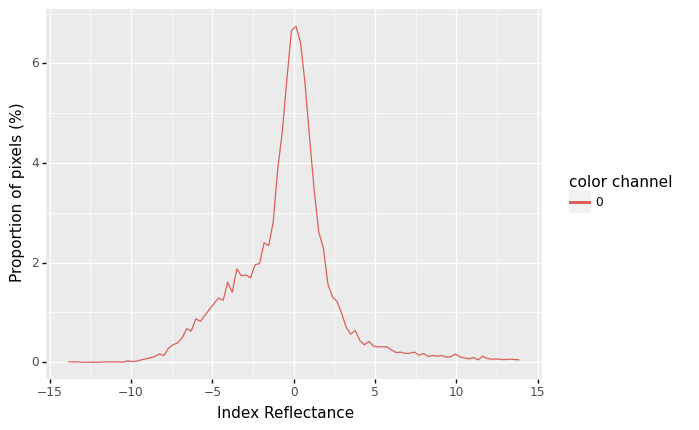

<ggplot: (2979626588993)>

In [109]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_2_1, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [110]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


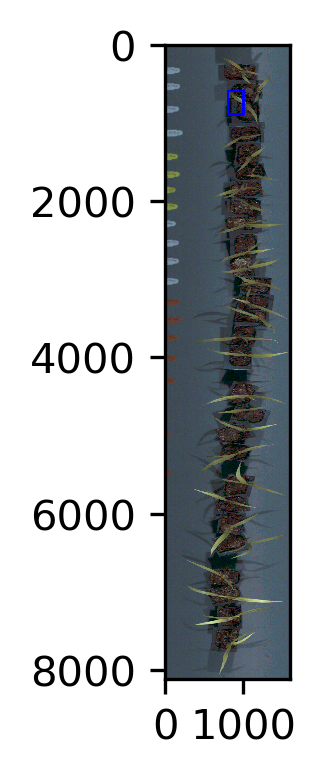

In [111]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_3_1, roi_hierarchy_psent167_3_1 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=800, y=600, h=300, w=200)

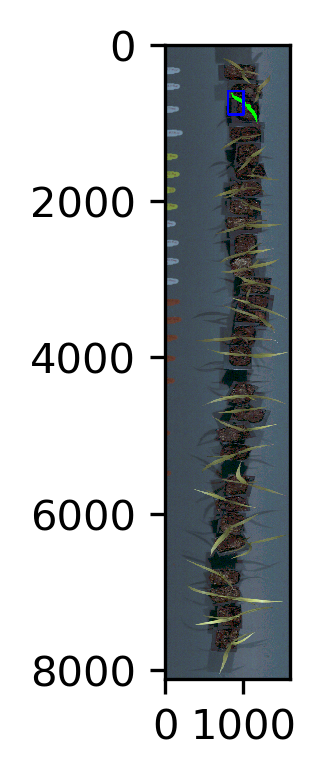

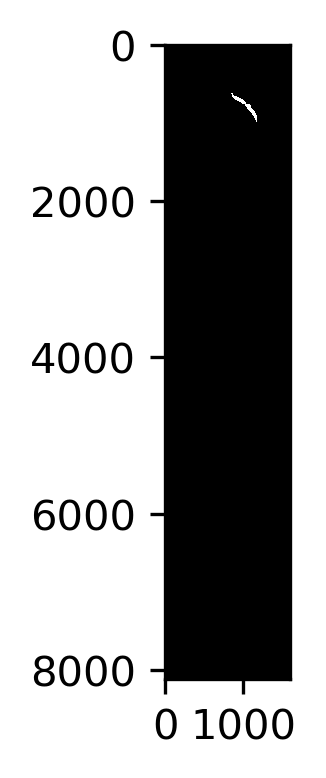

In [112]:
roi_objects_psent167_3_1, hierarchy_psent167_3_1, kept_mask_psent167_3_1, obj_area_psent167_3_1 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_3_1,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_3_1,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-15.361046, 70.072395] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


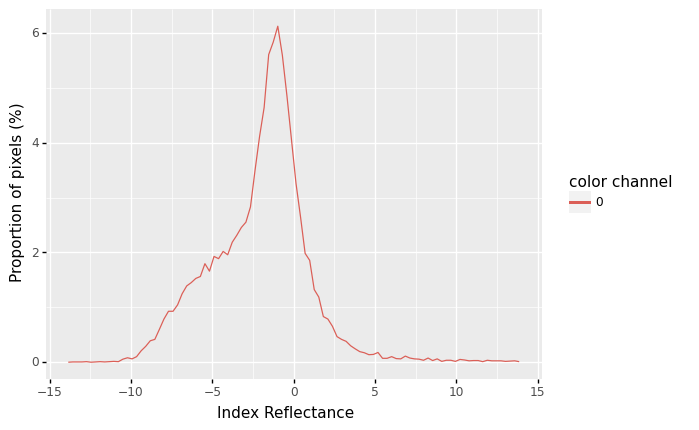

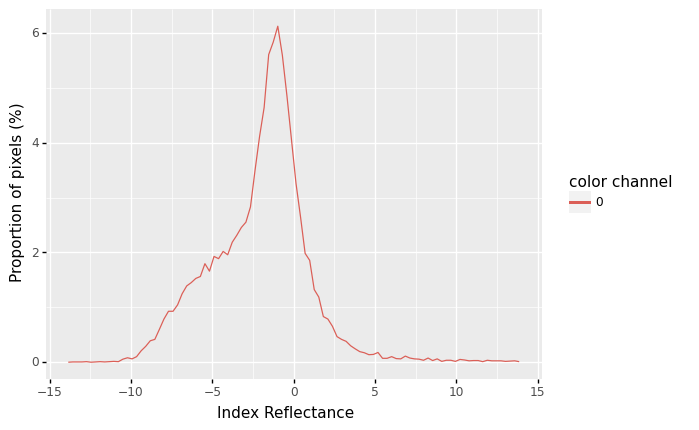

<ggplot: (2979629809137)>

In [113]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_3_1, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [114]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


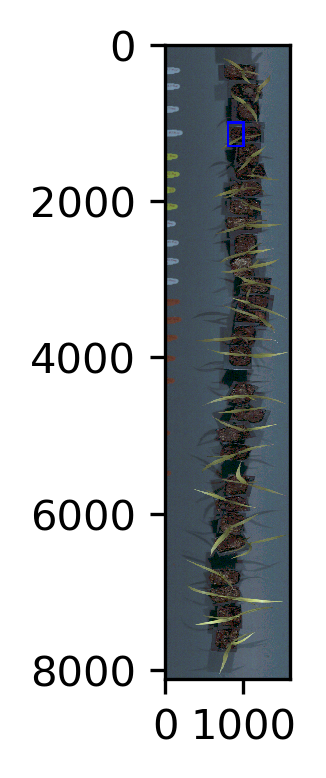

In [115]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_4_10, roi_hierarchy_psent167_4_10 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=800, y=1000, h=300, w=200)

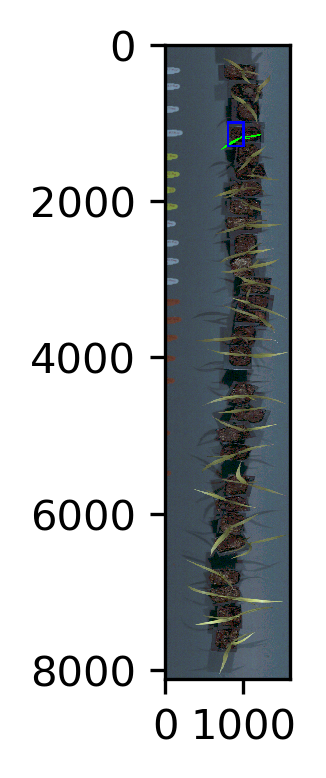

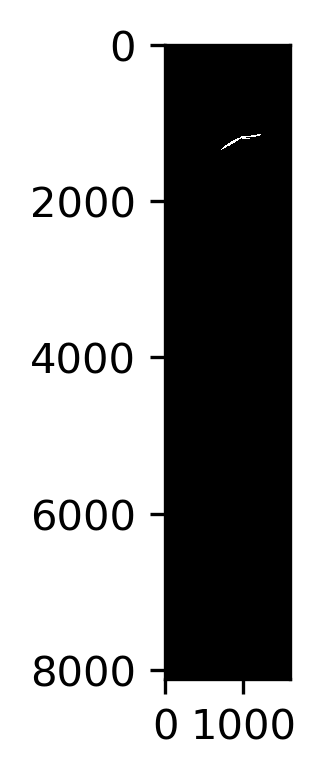

In [116]:
roi_objects_psent167_4_10, hierarchy_psent167_4_10, kept_mask_psent167_4_10, obj_area_psent167_4_10 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_4_10,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_4_10,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-12.488243, 84.58986] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


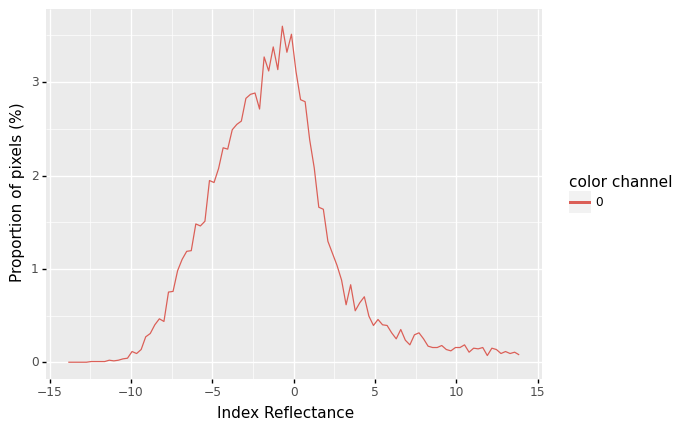

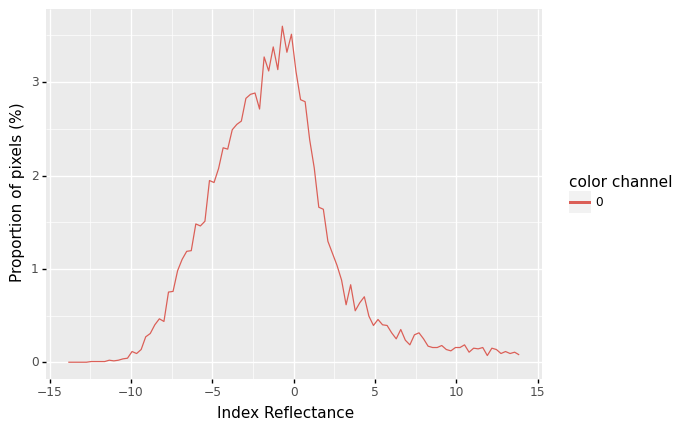

<ggplot: (2979809877281)>

In [117]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_4_10, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [118]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


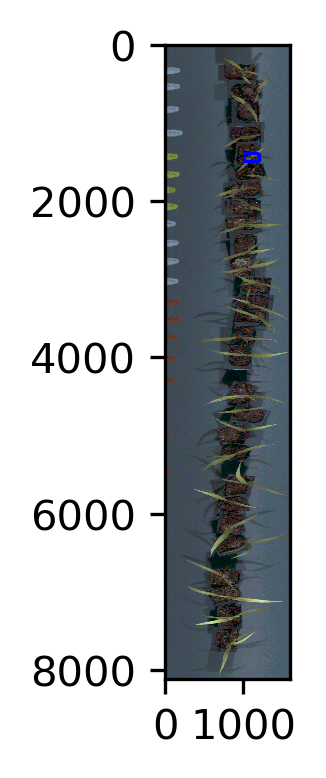

In [121]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_5_10, roi_hierarchy_psent167_5_10 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=1400, h=100, w=200)

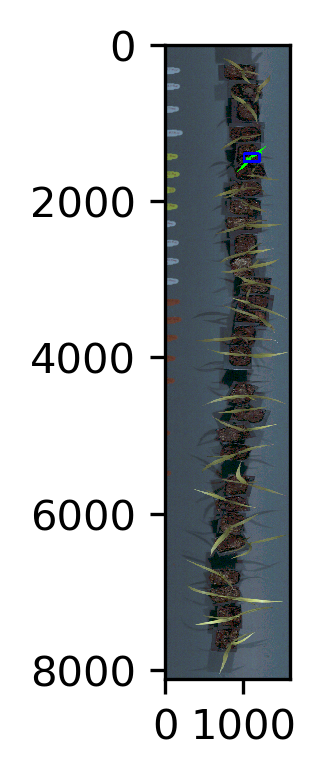

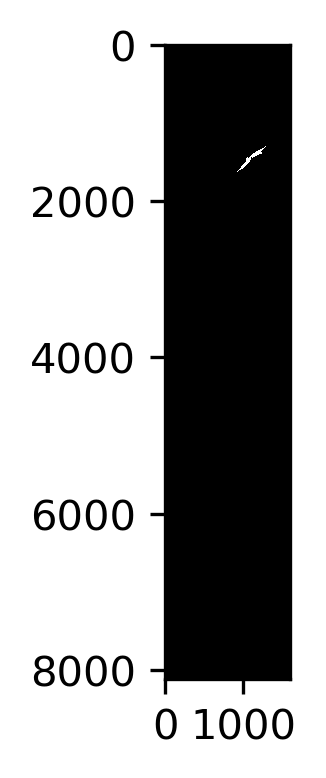

In [122]:
roi_objects_psent167_5_10, hierarchy_psent167_5_10, kept_mask_psent167_5_10, obj_area_psent167_5_10 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_5_10,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_5_10,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-11.836713, 36.423935] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


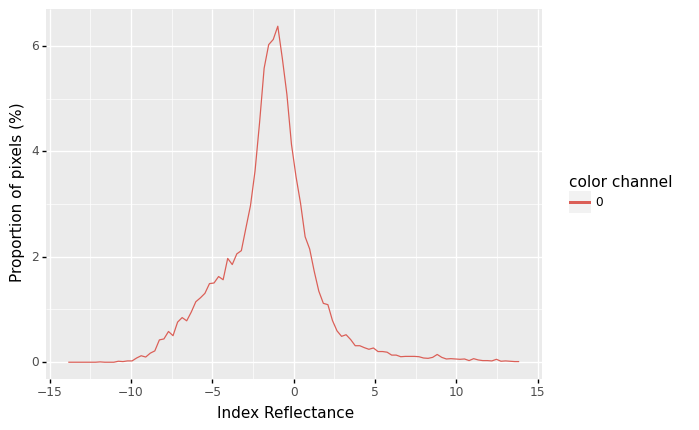

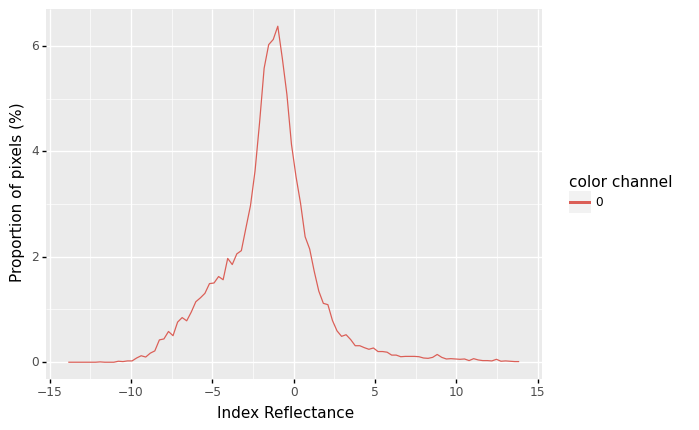

<ggplot: (2979626828537)>

In [123]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_5_10, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [124]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DSP_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


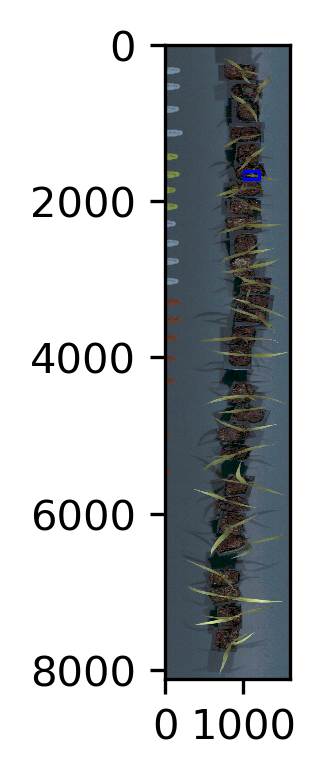

In [126]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10, roi_hierarchy_psent167_6_10 = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=1630, h=100, w=200)

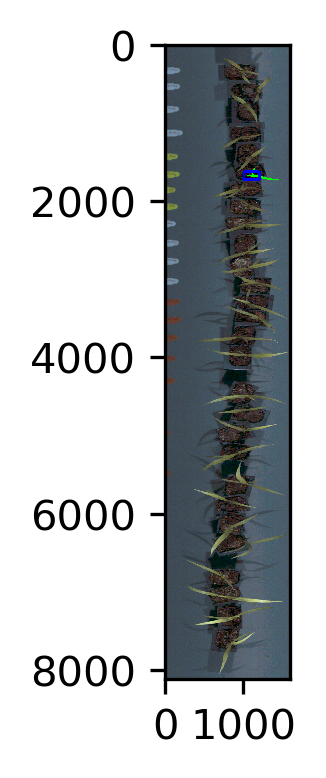

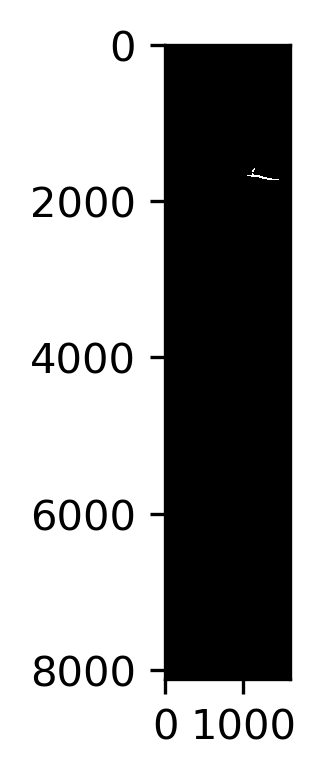

In [127]:
roi_objects_psent167_6_10, hierarchy_psent167_6_10, kept_mask_psent167_6_10, obj_area_psent167_6_10 = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-20.130697, 743.77655] but the user defined range of bins for pixel frequencies is [-14, 8]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


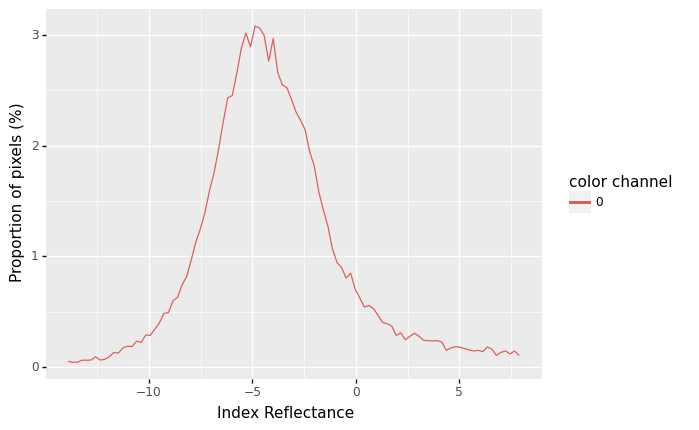

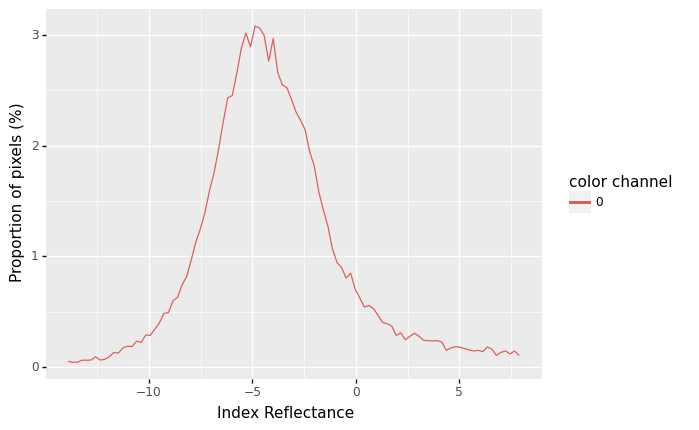

<ggplot: (2942921366825)>

In [74]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [128]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DSP_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


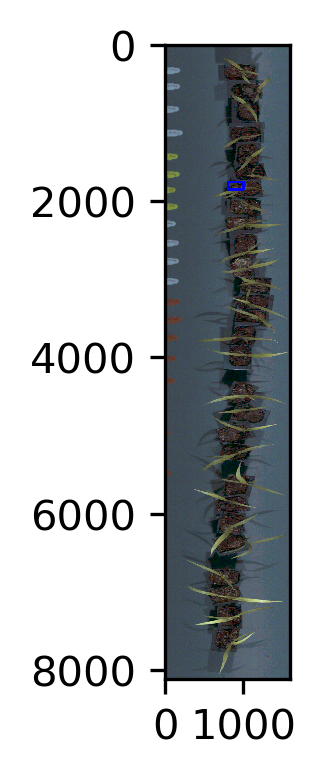

In [130]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_A, roi_hierarchy_psent167_6_10_A = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=800, y=1760, h=100, w=200)

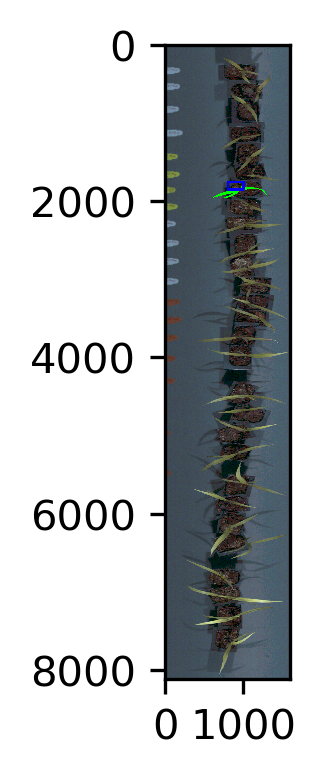

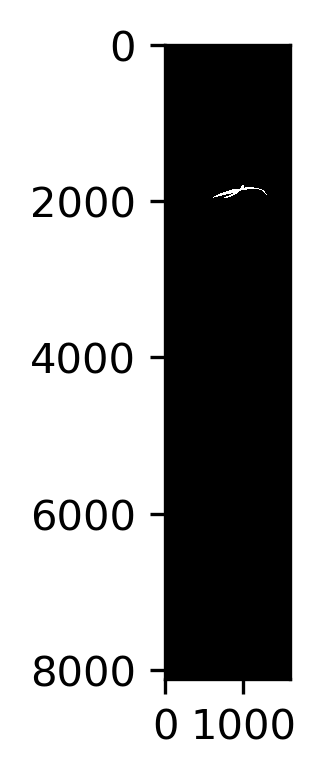

In [131]:
roi_objects_psent167_6_10_A, hierarchy_psent167_6_10_A, kept_mask_psent167_6_10_A, obj_area_psent167_6_10_A = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_A,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_A,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-15.955311, 35.754642] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


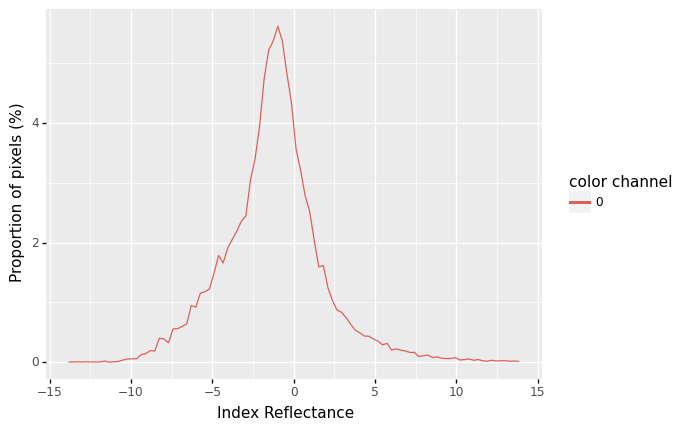

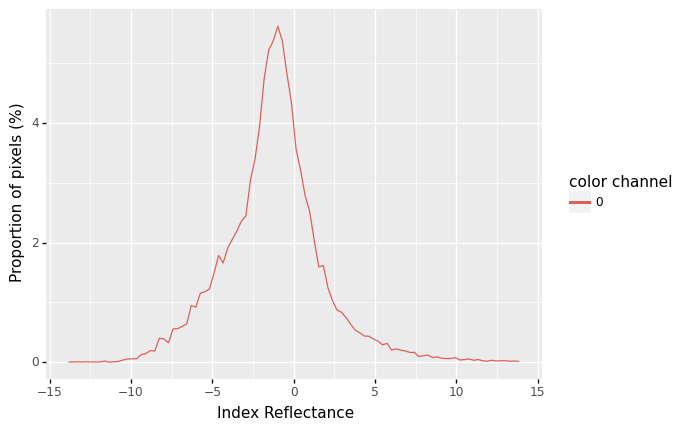

<ggplot: (2982799781049)>

In [132]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_A, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [133]:
##### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DSP_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


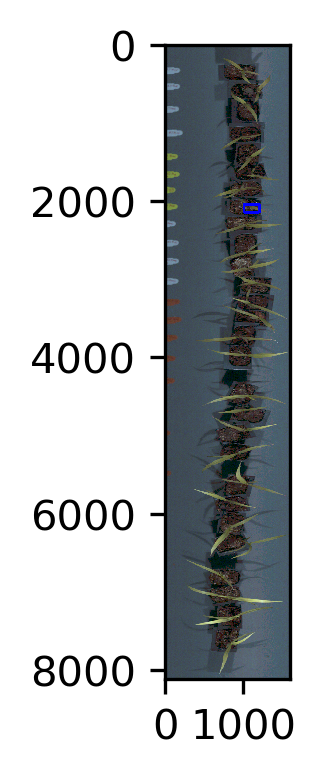

In [18]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_B, roi_hierarchy_psent167_6_10_B = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=2050, h=100, w=200)

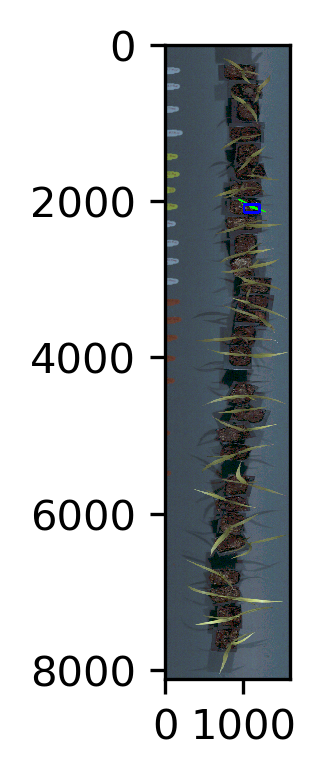

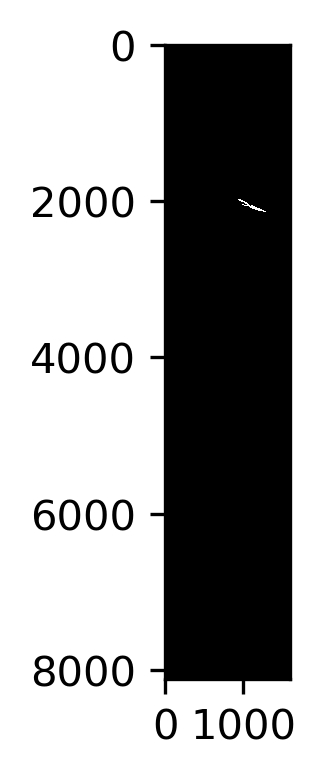

In [19]:
roi_objects_psent167_6_10_B, hierarchy_psent167_6_10_B, kept_mask_psent167_6_10_B, obj_area_psent167_6_10_B = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_B,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_B,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-15.523529, 60.71033] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


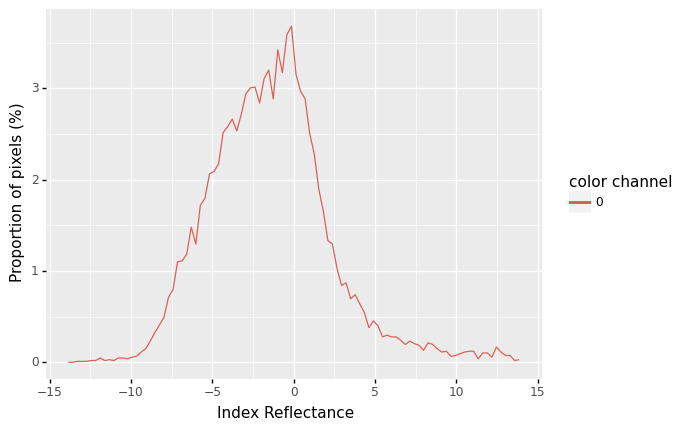

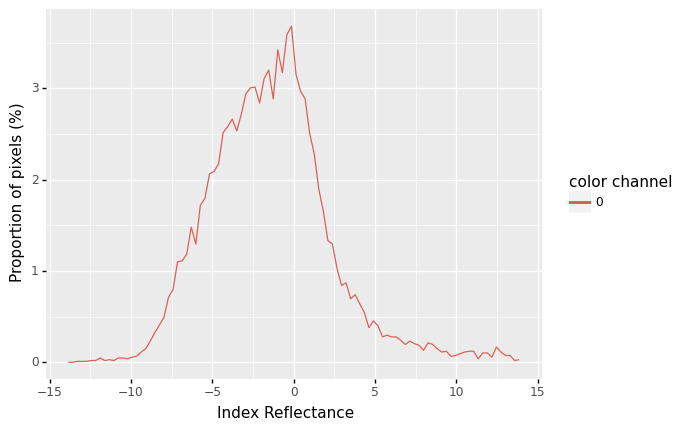

<ggplot: (2980127927205)>

In [20]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_B, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [21]:
### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DSP_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


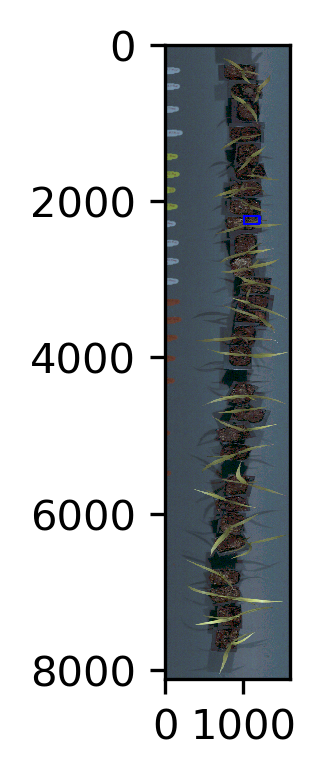

In [140]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_C, roi_hierarchy_psent167_6_10_C = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=2198, h=100, w=200)

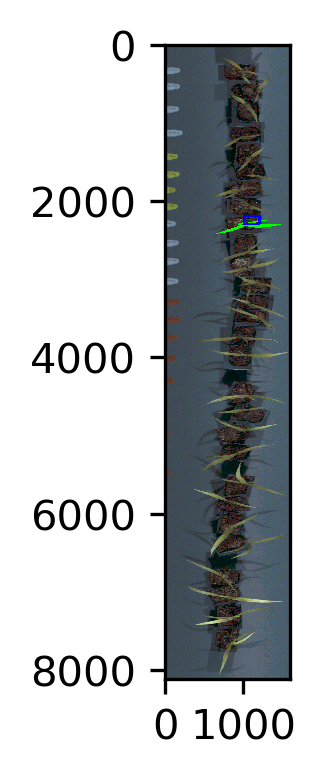

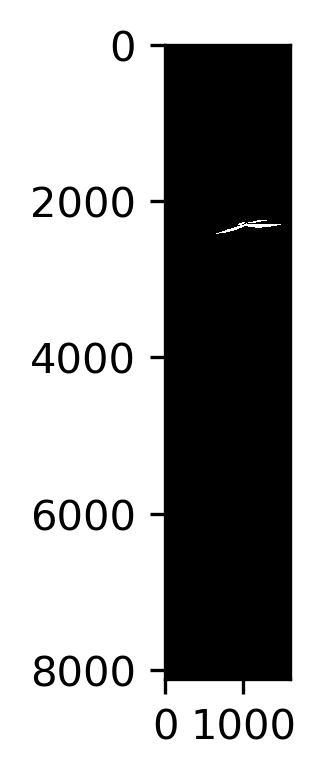

In [141]:
roi_objects_psent167_6_10_C, hierarchy_psent167_6_10_C, kept_mask_psent167_6_10_C, obj_area_psent167_6_10_C = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_C,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_C,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-15.049755, 63.278378] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


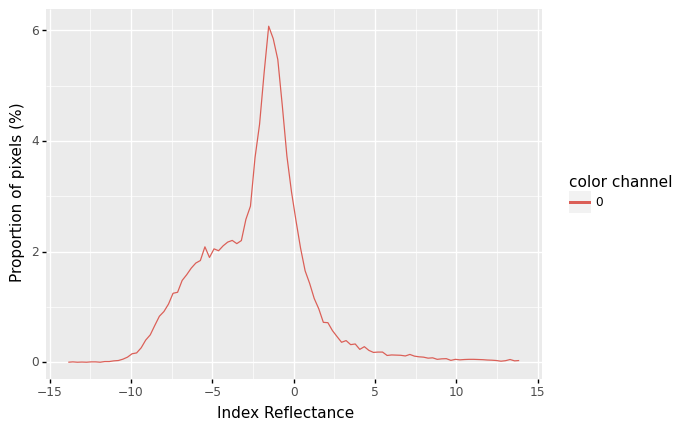

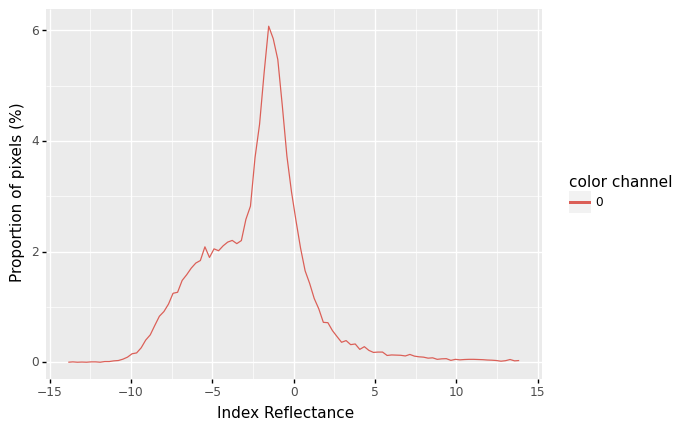

<ggplot: (2982799226401)>

In [142]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_C, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [143]:
### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DEX_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


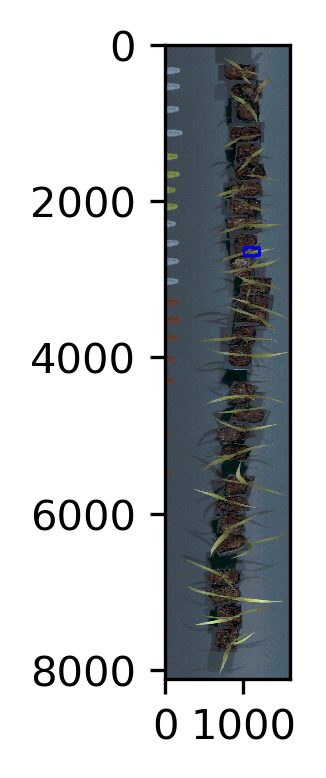

In [145]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_D, roi_hierarchy_psent167_6_10_D = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=2600, h=100, w=200)

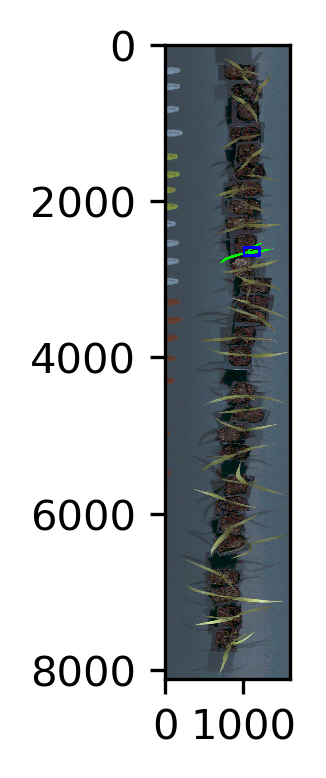

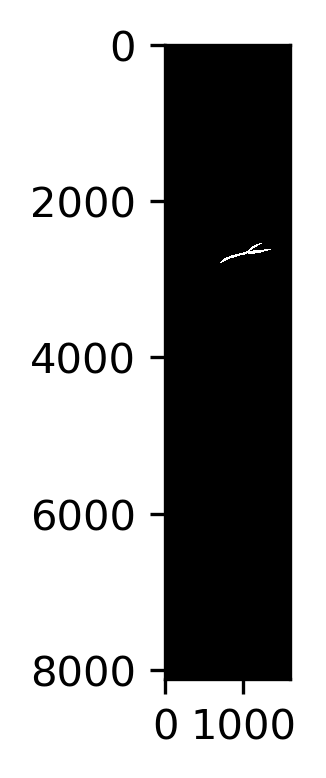

In [146]:
roi_objects_psent167_6_10_D, hierarchy_psent167_6_10_D, kept_mask_psent167_6_10_D, obj_area_psent167_6_10_D = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_D,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_D,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-17.821232, 35.810966] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


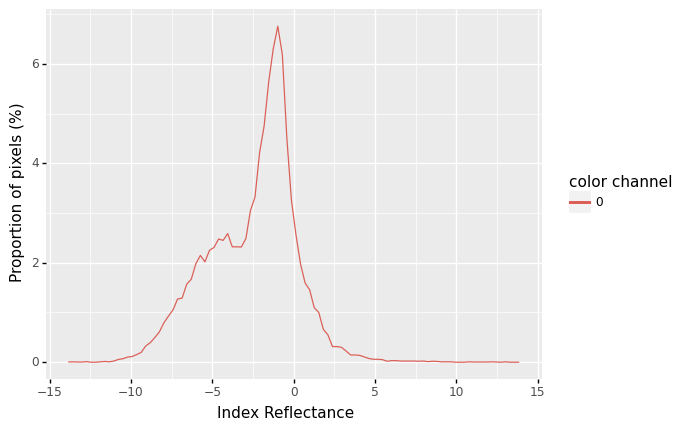

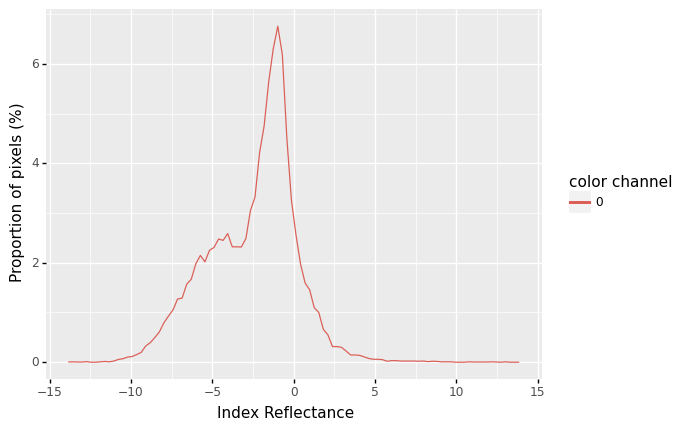

<ggplot: (2982799761501)>

In [147]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_D, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [148]:
### Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DEX_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


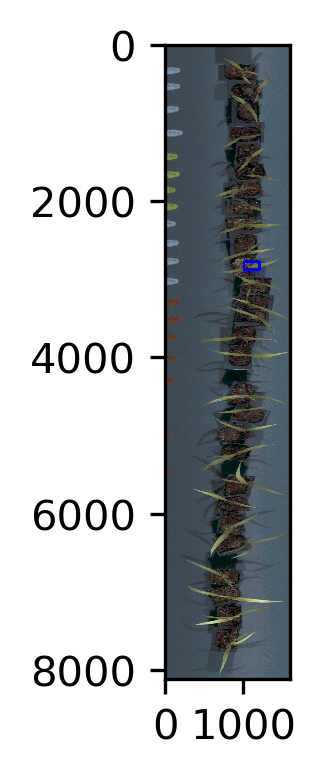

In [151]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_E, roi_hierarchy_psent167_6_10_E = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=2780, h=100, w=200)

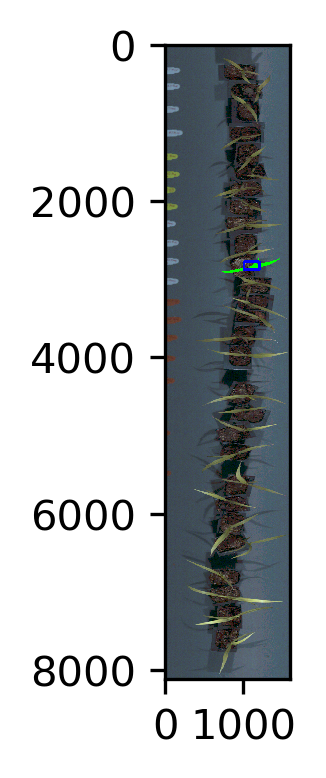

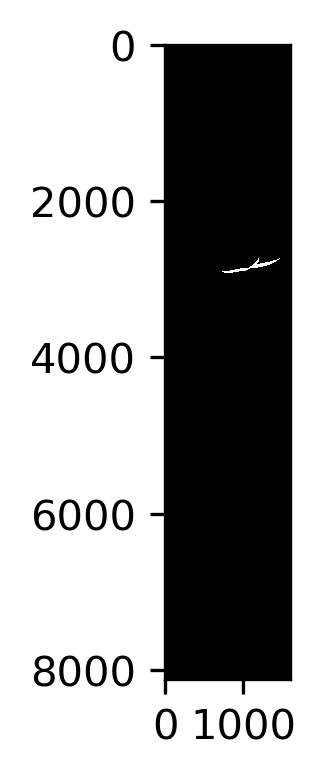

In [152]:
roi_objects_psent167_6_10_E, hierarchy_psent167_6_10_E, kept_mask_psent167_6_10_E, obj_area_psent167_6_10_E = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_E,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_E,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-14.098463, 58.917114] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


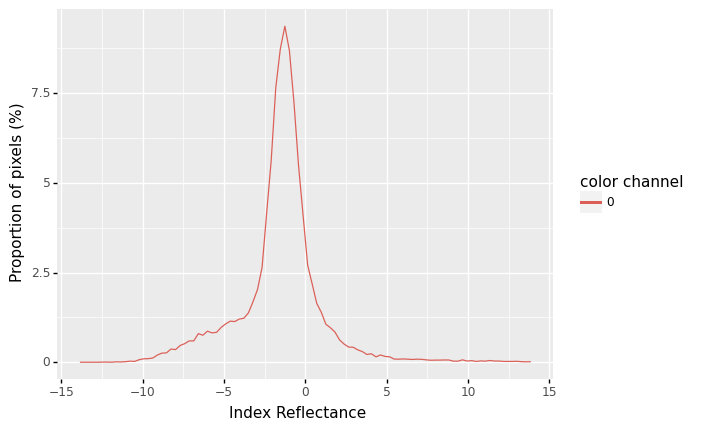

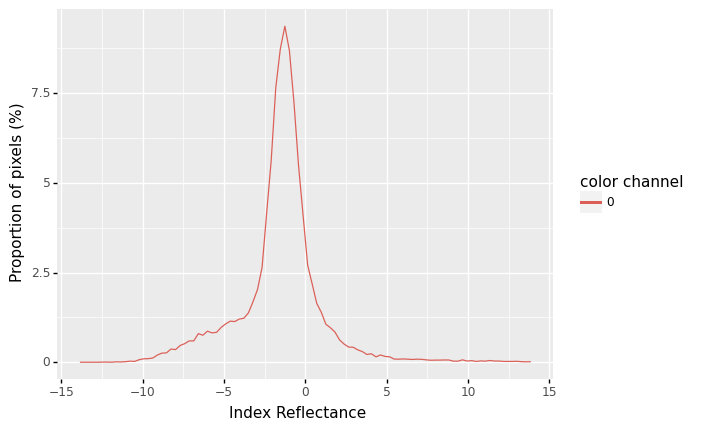

<ggplot: (2979818072773)>

In [153]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_E, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [154]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DEX_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


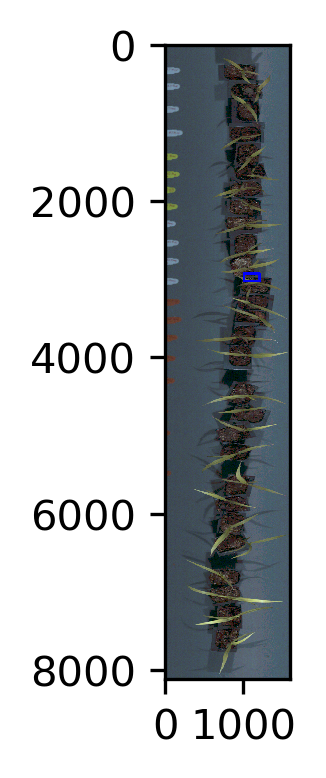

In [155]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_F, roi_hierarchy_psent167_6_10_F = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=2930, h=100, w=200)

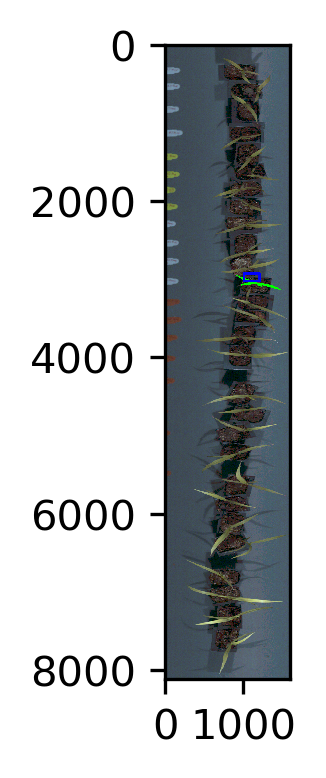

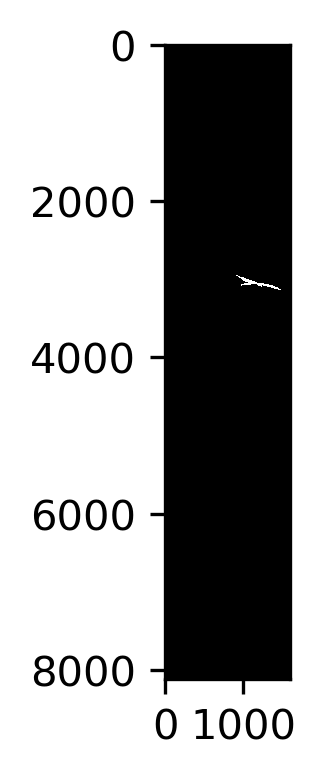

In [156]:
roi_objects_psent167_6_10_F, hierarchy_psent167_6_10_F, kept_mask_psent167_6_10_F, obj_area_psent167_6_10_F = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_F,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_F,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-15.870895, 41.76496] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


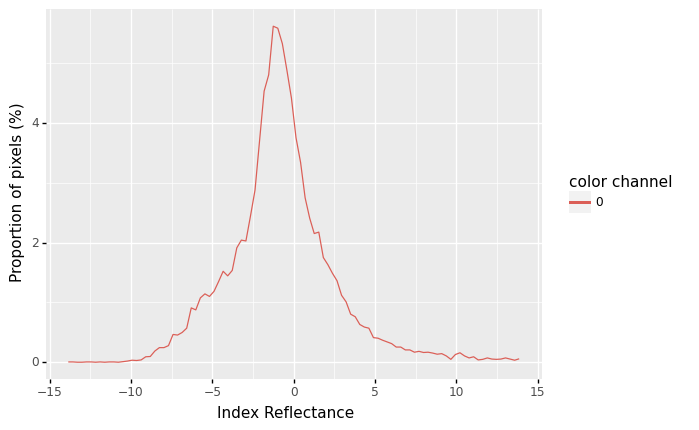

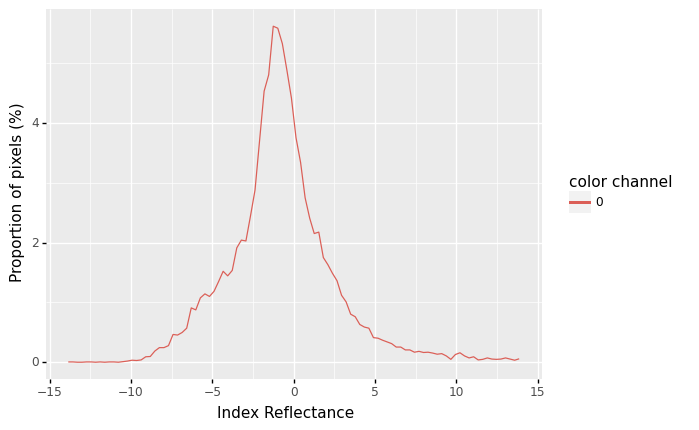

<ggplot: (2982799732617)>

In [157]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_F, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [158]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-7_1uM_DEX_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


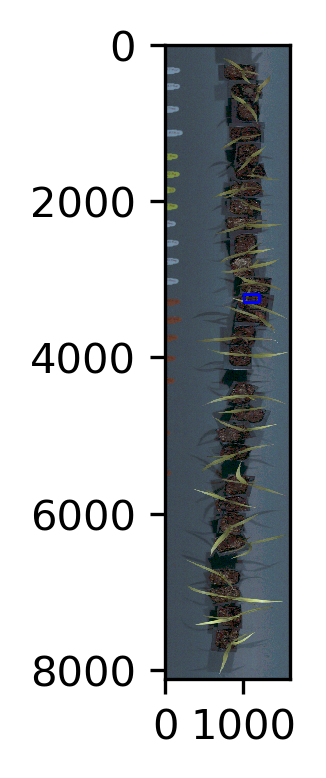

In [161]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_G, roi_hierarchy_psent167_6_10_G = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=3200, h=100, w=200)

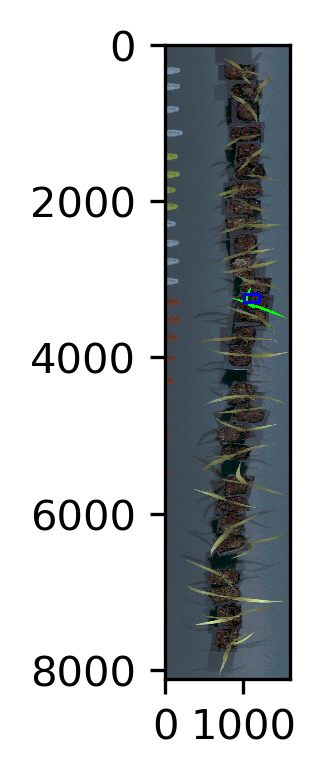

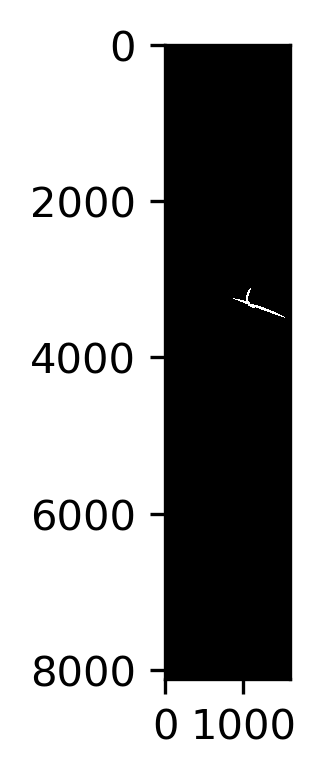

In [162]:
roi_objects_psent167_6_10_G, hierarchy_psent167_6_10_G, kept_mask_psent167_6_10_G, obj_area_psent167_6_10_G = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_G,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_G,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-12.999849, 71.957214] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


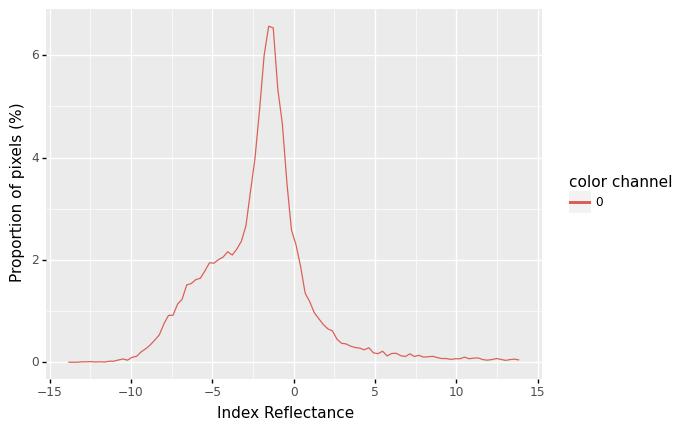

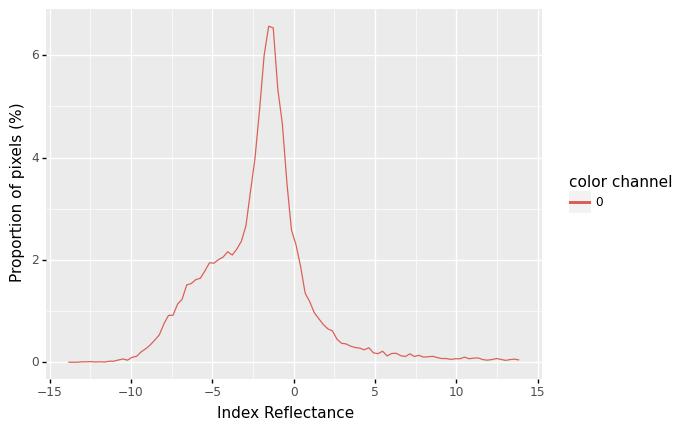

<ggplot: (2979629186465)>

In [163]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_G, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [164]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_TA_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


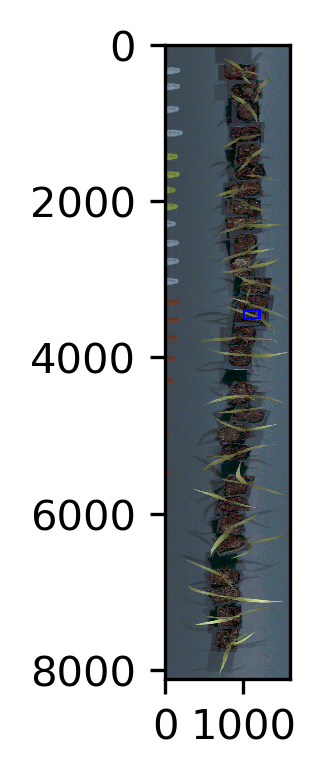

In [166]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_H, roi_hierarchy_psent167_6_10_H = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=3400, h=100, w=200)

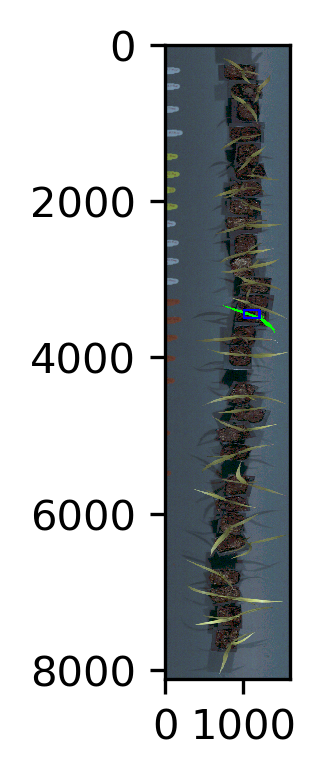

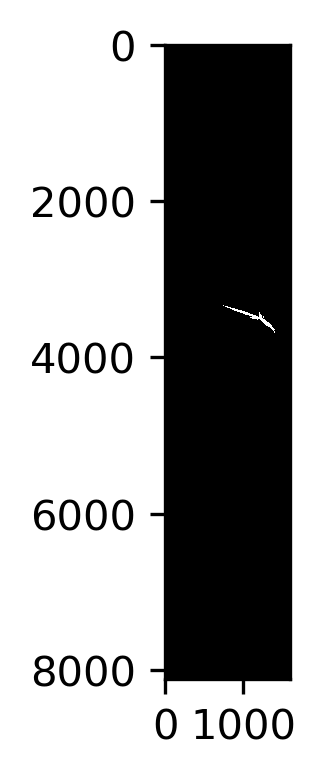

In [167]:
roi_objects_psent167_6_10_H, hierarchy_psent167_6_10_H, kept_mask_psent167_6_10_H, obj_area_psent167_6_10_H = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_H,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_H,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-13.47065, 105.21818] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


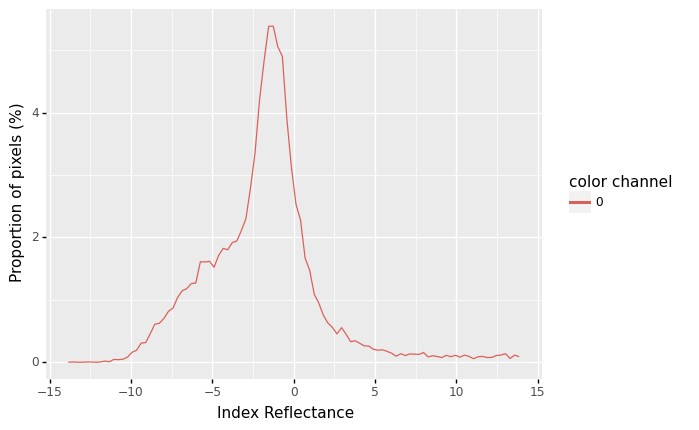

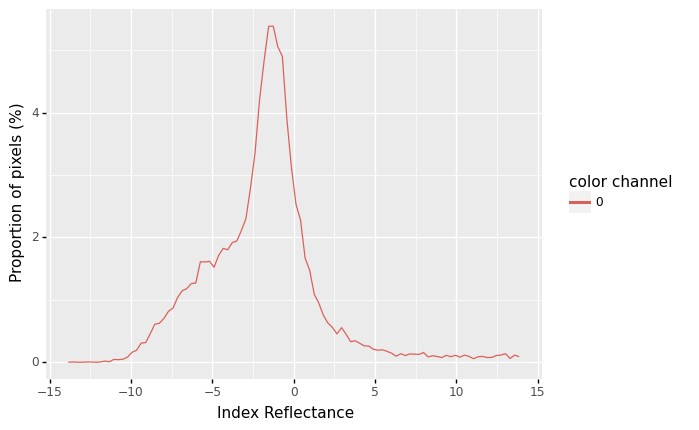

<ggplot: (2979636332489)>

In [168]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_H, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [169]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_TA_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


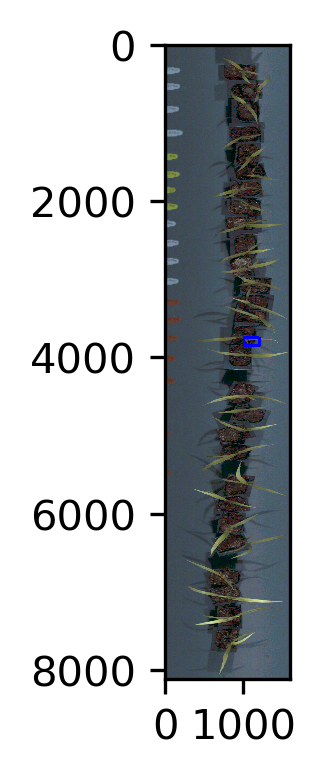

In [173]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_I, roi_hierarchy_psent167_6_10_I = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=3750, h=100, w=200)

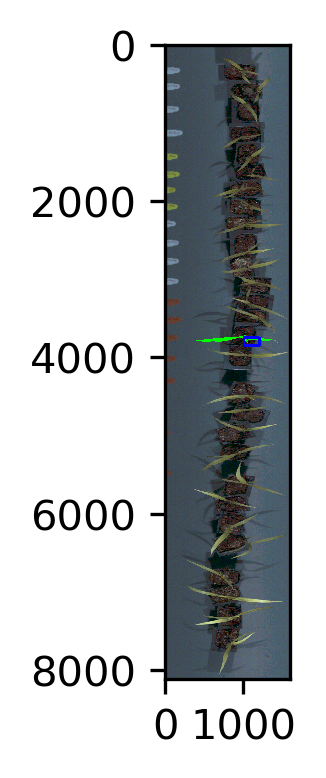

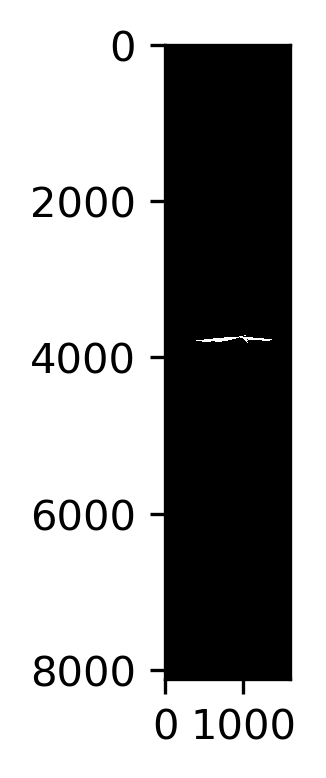

In [174]:
roi_objects_psent167_6_10_I, hierarchy_psent167_6_10_I, kept_mask_psent167_6_10_I, obj_area_psent167_6_10_I = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_I,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_I,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-13.462334, 43.02668] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


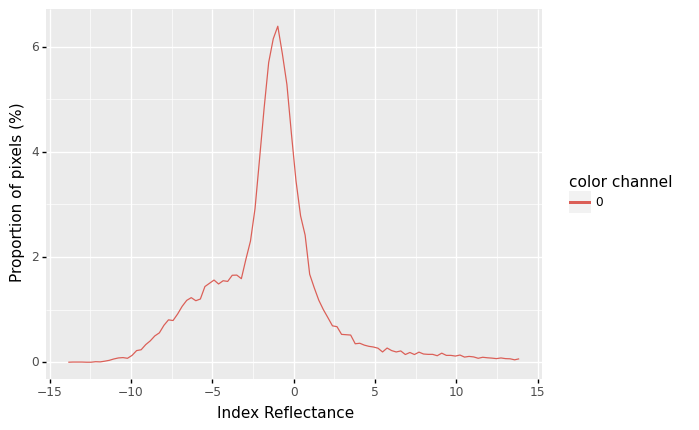

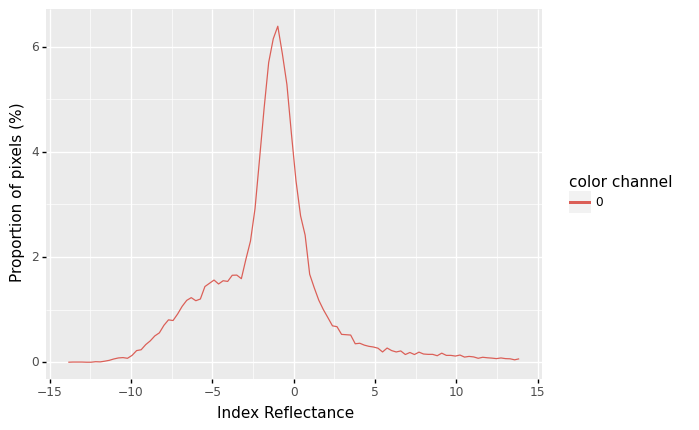

<ggplot: (2982799709705)>

In [175]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_I, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [176]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_TA_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


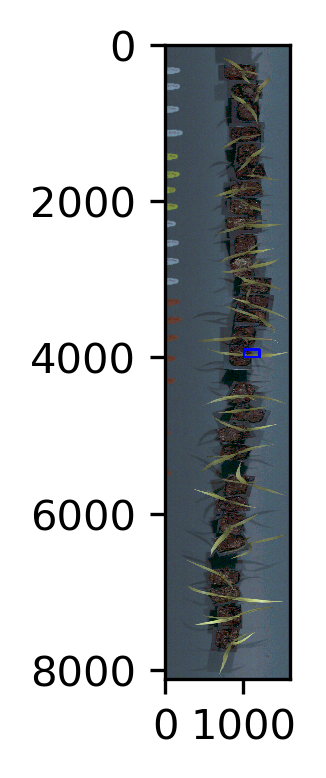

In [177]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_J, roi_hierarchy_psent167_6_10_J = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=3900, h=100, w=200)

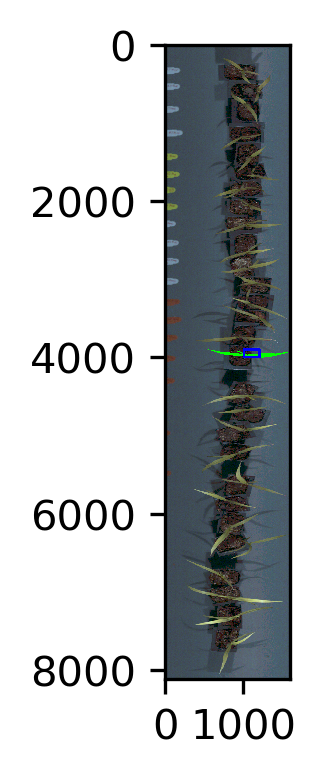

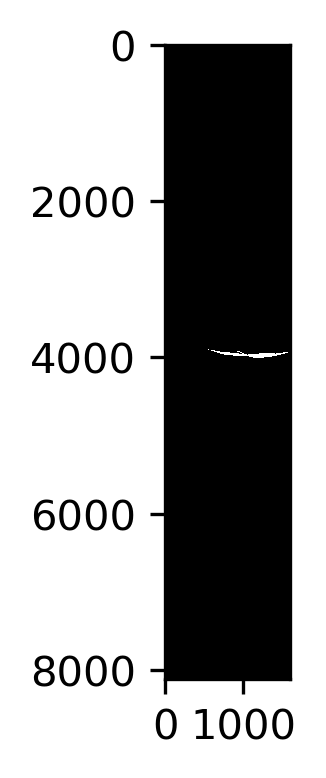

In [178]:
roi_objects_psent167_6_10_J, hierarchy_psent167_6_10_J, kept_mask_psent167_6_10_J, obj_area_psent167_6_10_J = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_J,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_J,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-13.091258, 121.37123] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


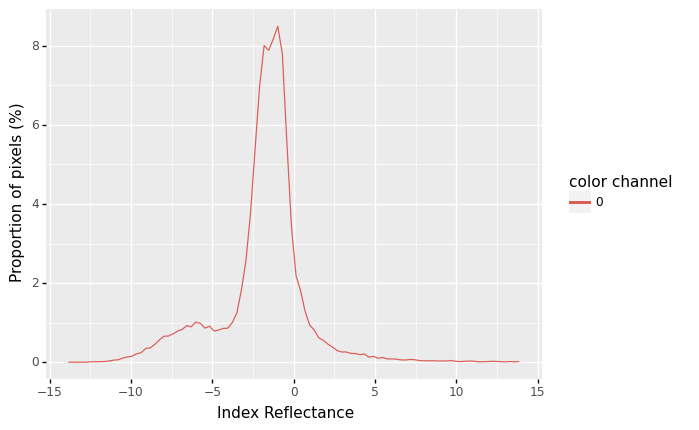

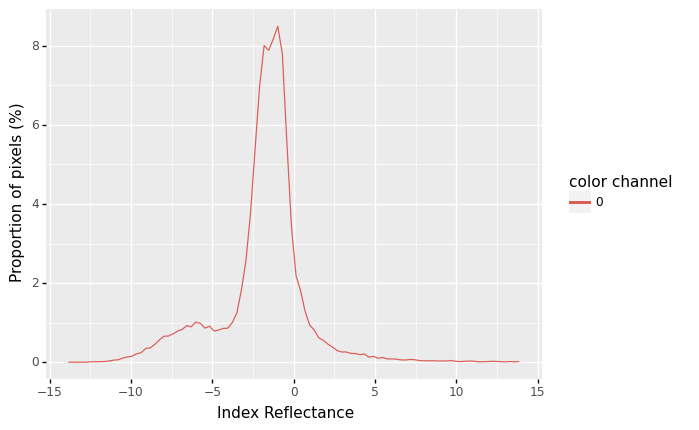

<ggplot: (2979626831437)>

In [179]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_J, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [180]:
# Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_TA_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


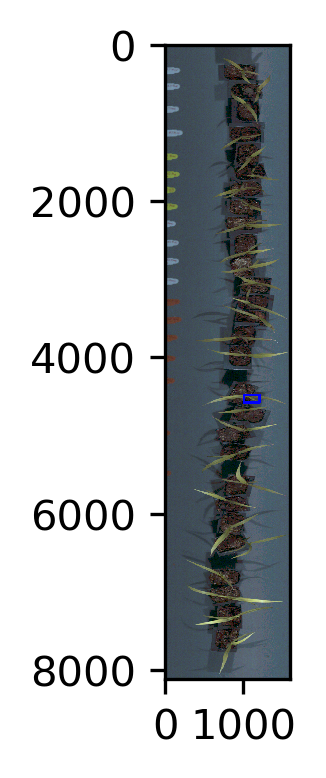

In [184]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_K, roi_hierarchy_psent167_6_10_K = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=4480, h=100, w=200)

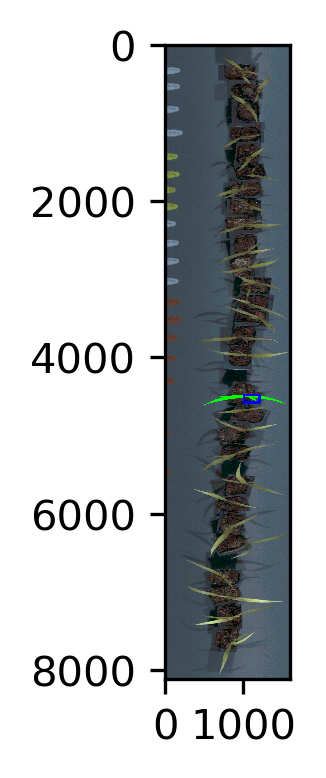

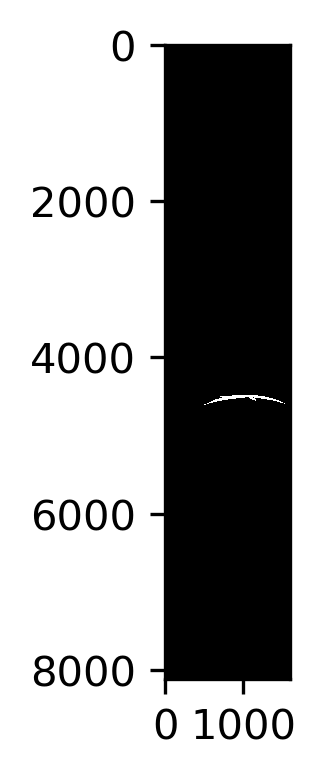

In [185]:
roi_objects_psent167_6_10_K, hierarchy_psent167_6_10_K, kept_mask_psent167_6_10_K, obj_area_psent167_6_10_K = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_K,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_K,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-16.621048, 77.73703] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


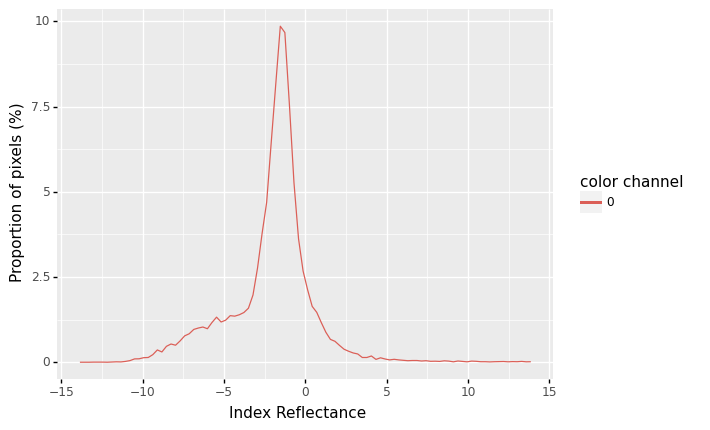

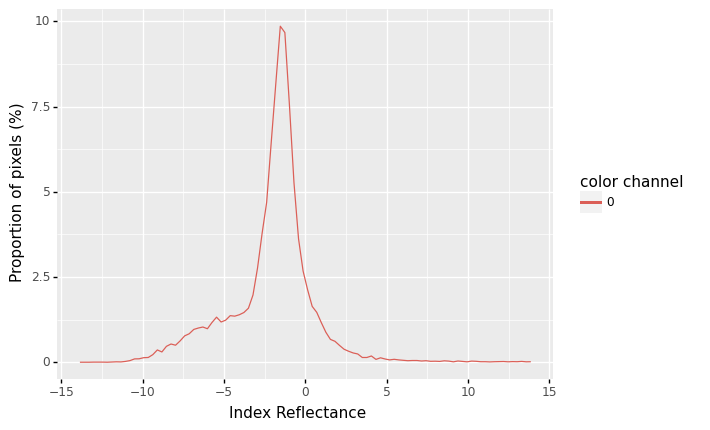

<ggplot: (2982799628609)>

In [186]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_K, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [187]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DSP_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


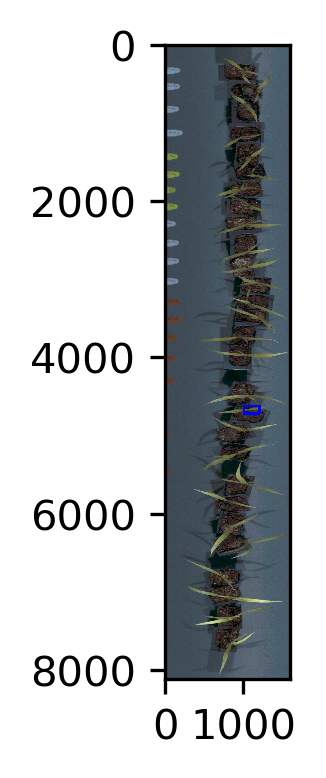

In [190]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_L, roi_hierarchy_psent167_6_10_L = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=4620, h=100, w=200)

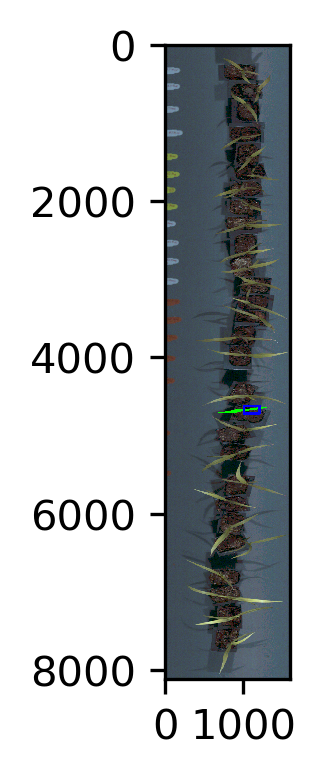

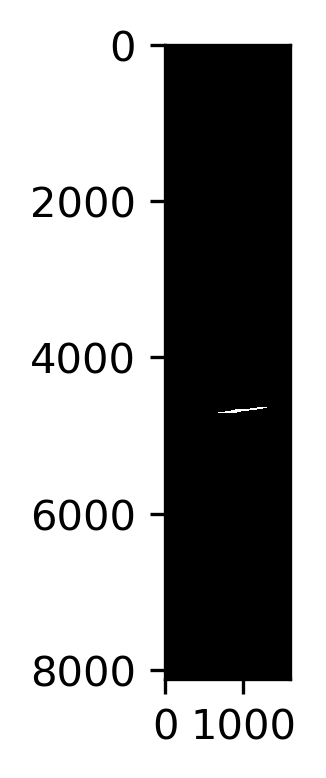

In [191]:
roi_objects_psent167_6_10_L, hierarchy_psent167_6_10_L, kept_mask_psent167_6_10_L, obj_area_psent167_6_10_L = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_L,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_L,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-16.017853, 35.614155] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


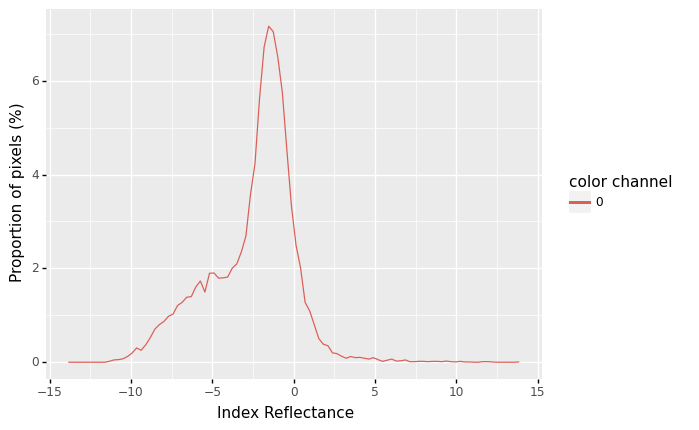

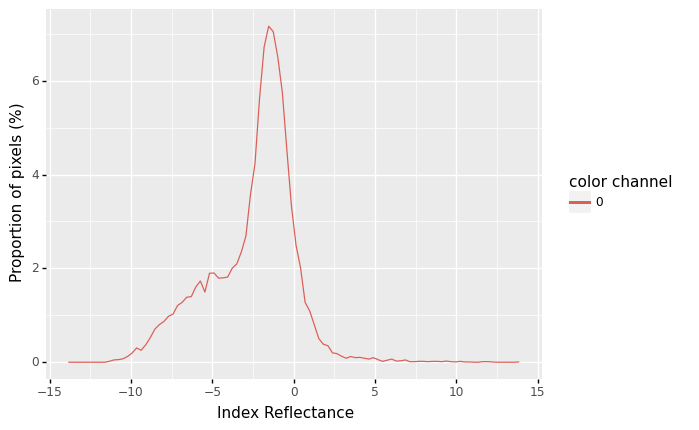

<ggplot: (2982799886029)>

In [192]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_L, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [193]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DSP_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


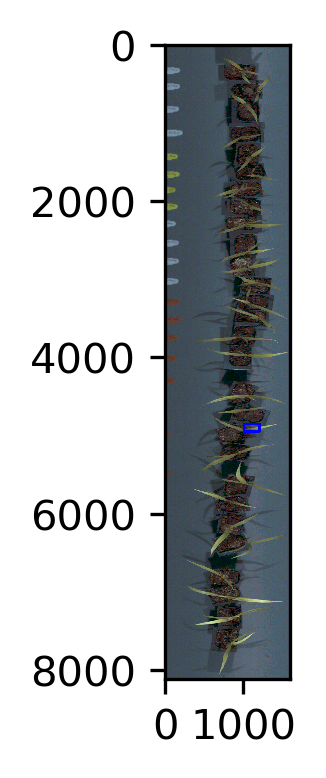

In [195]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_M, roi_hierarchy_psent167_6_10_M = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=4850, h=100, w=200)

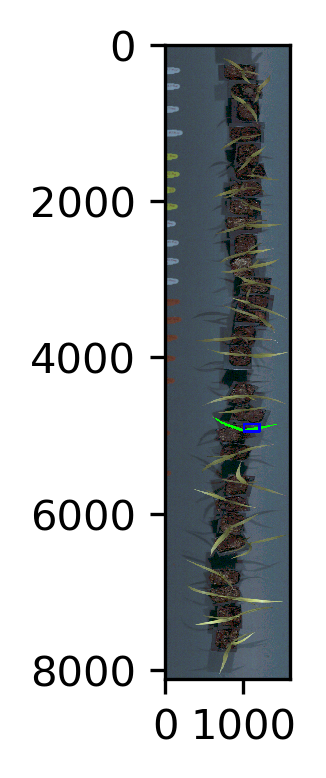

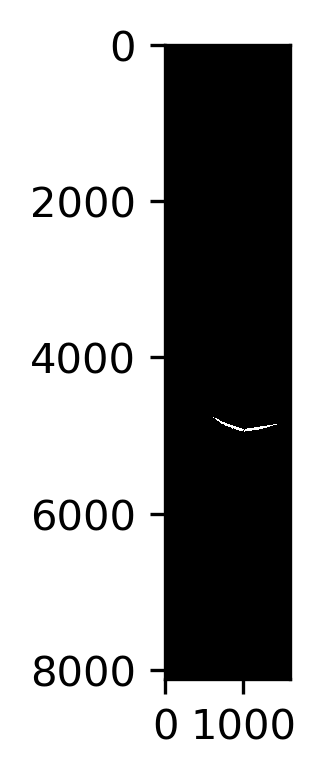

In [196]:
roi_objects_psent167_6_10_M, hierarchy_psent167_6_10_M, kept_mask_psent167_6_10_M, obj_area_psent167_6_10_M = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_M,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_M,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-12.690011, 74.95728] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


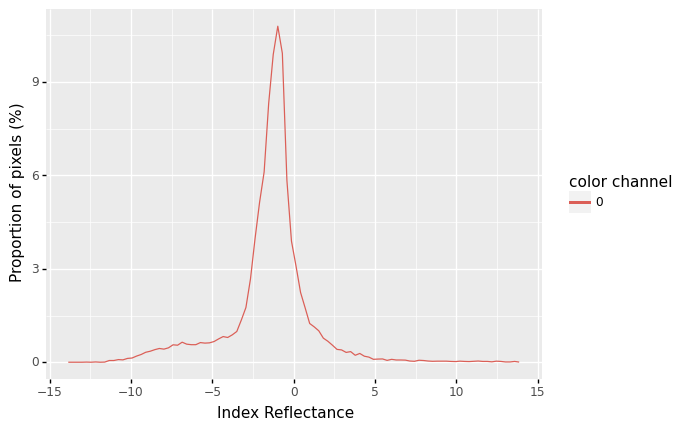

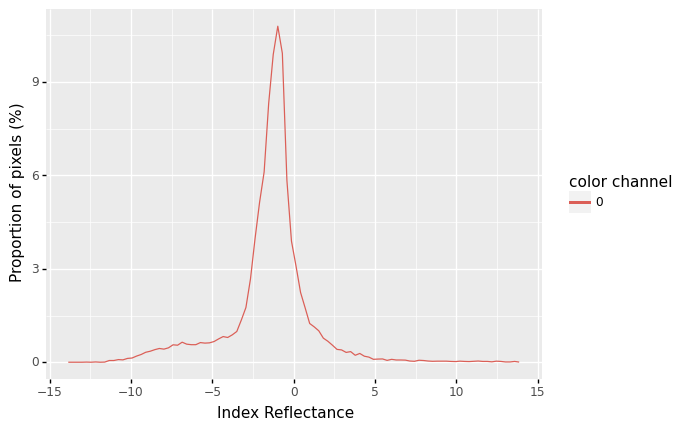

<ggplot: (2982799960581)>

In [197]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_M, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [198]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DSP_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


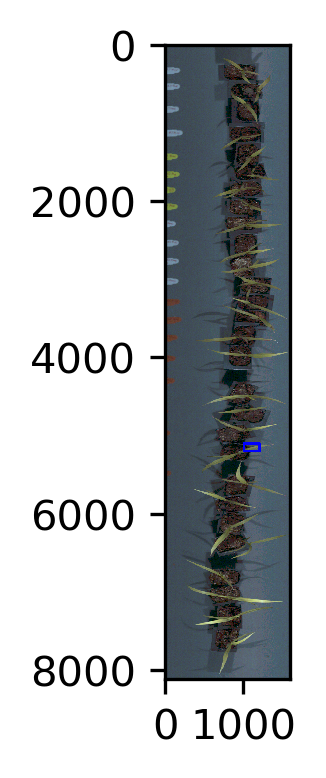

In [199]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_N, roi_hierarchy_psent167_6_10_N = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=5100, h=100, w=200)

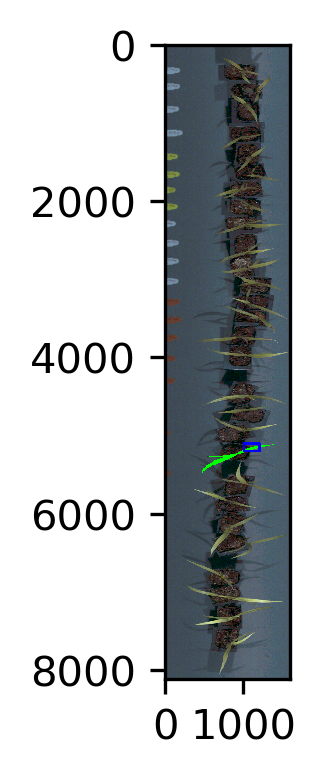

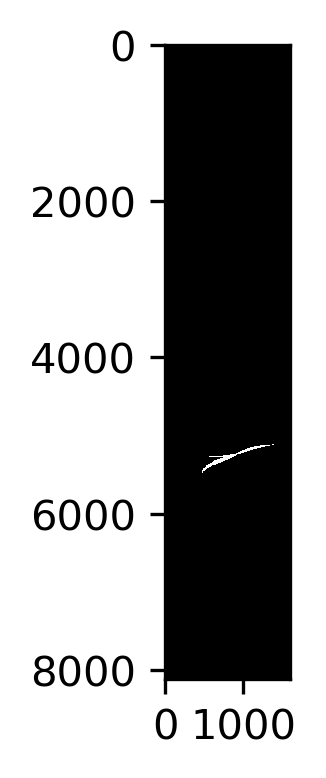

In [200]:
roi_objects_psent167_6_10_N, hierarchy_psent167_6_10_N, kept_mask_psent167_6_10_N, obj_area_psent167_6_10_N = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_N,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_N,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-20.058256, 41.850513] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


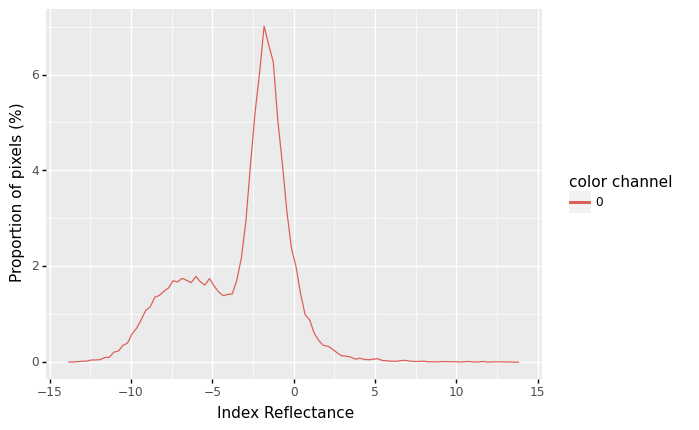

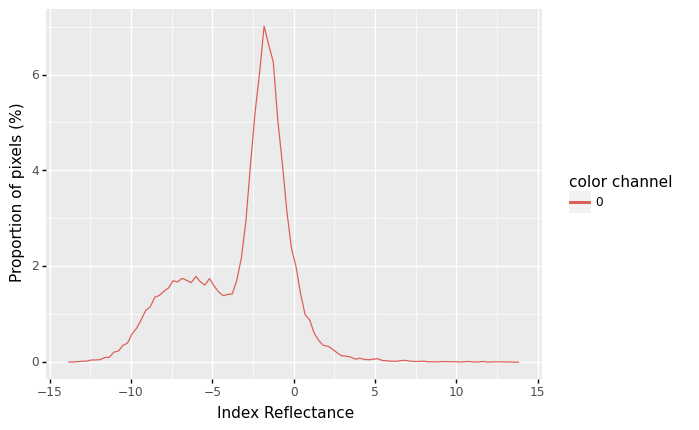

<ggplot: (2982800127649)>

In [201]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_N, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [202]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DSP_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


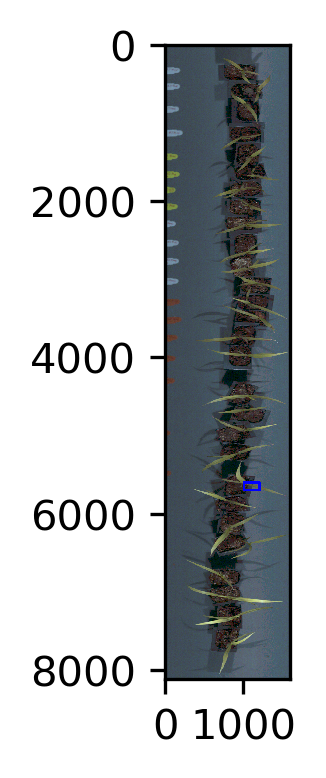

In [204]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_O, roi_hierarchy_psent167_6_10_O = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=5600, h=100, w=200)

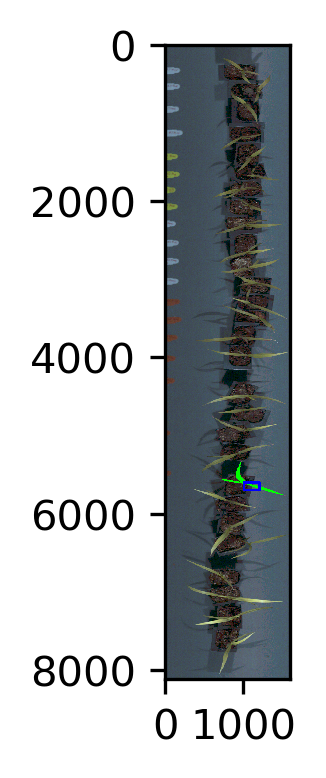

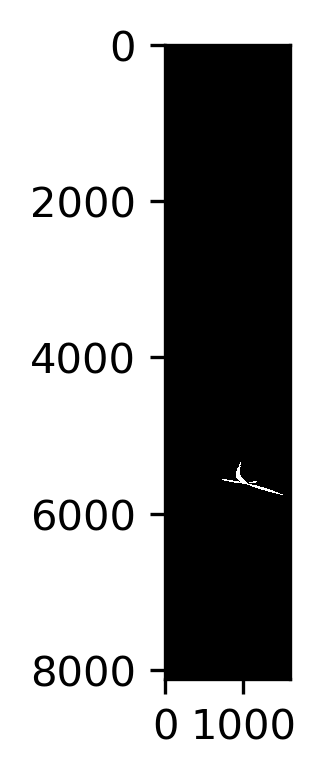

In [205]:
roi_objects_psent167_6_10_O, hierarchy_psent167_6_10_O, kept_mask_psent167_6_10_O, obj_area_psent167_6_10_O = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_O,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_O,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-11.971488, 210.2534] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


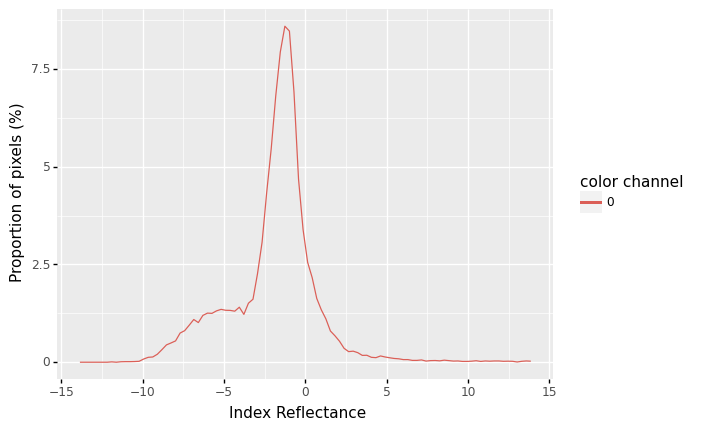

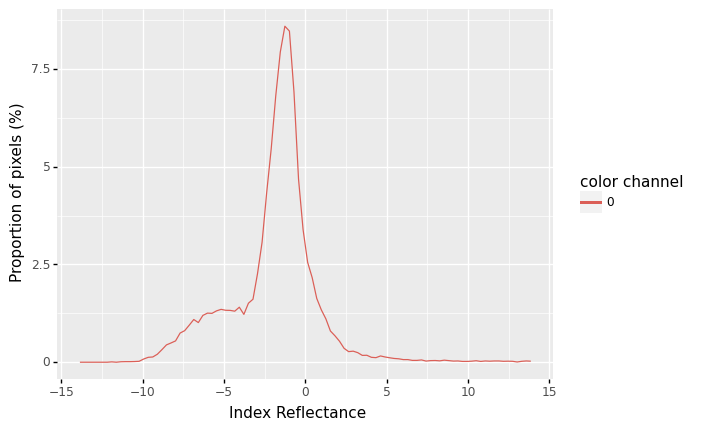

<ggplot: (2979629135481)>

In [206]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_O, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [207]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DEX_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


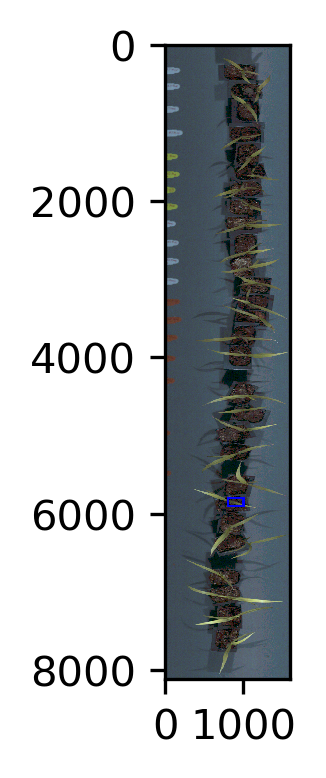

In [209]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_P, roi_hierarchy_psent167_6_10_P = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=800, y=5800, h=100, w=200)

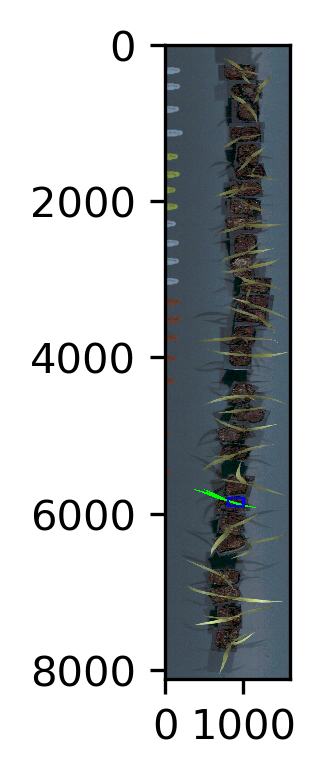

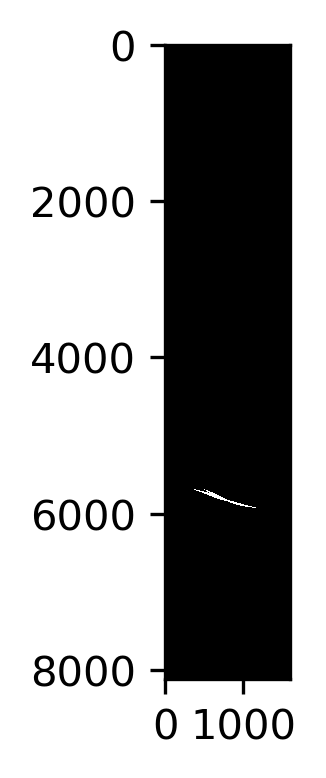

In [210]:
roi_objects_psent167_6_10_P, hierarchy_psent167_6_10_P, kept_mask_psent167_6_10_P, obj_area_psent167_6_10_P = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_P,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_P,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-20.06622, 114.63511] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


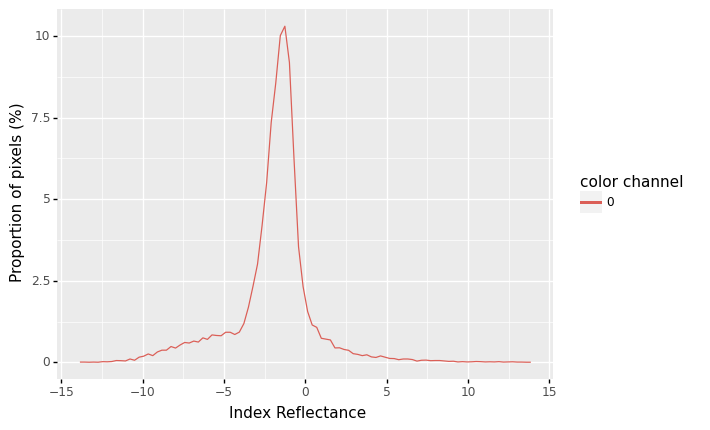

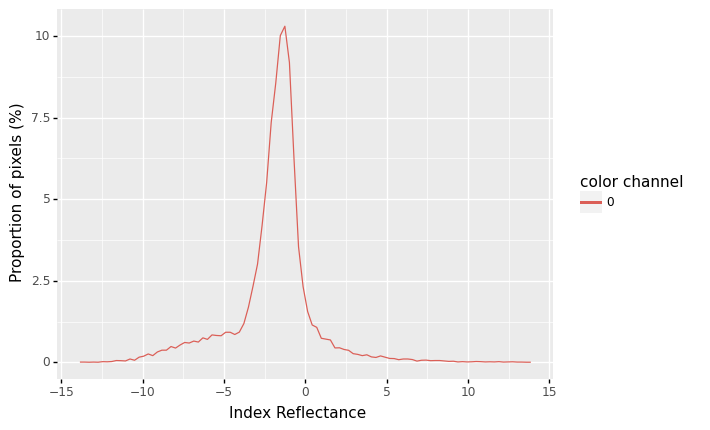

<ggplot: (2979629203357)>

In [211]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_P, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [212]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DEX_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


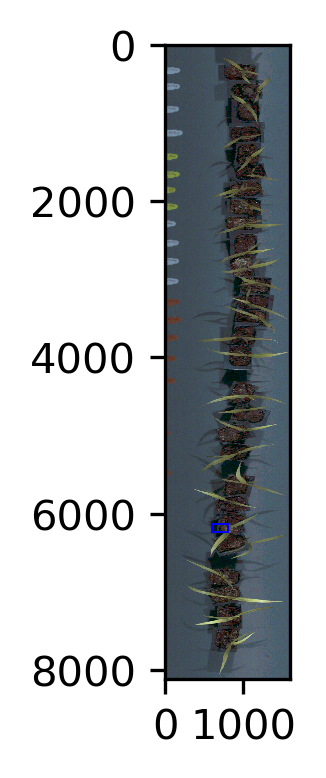

In [215]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_Q, roi_hierarchy_psent167_6_10_Q = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=600, y=6130, h=100, w=200)

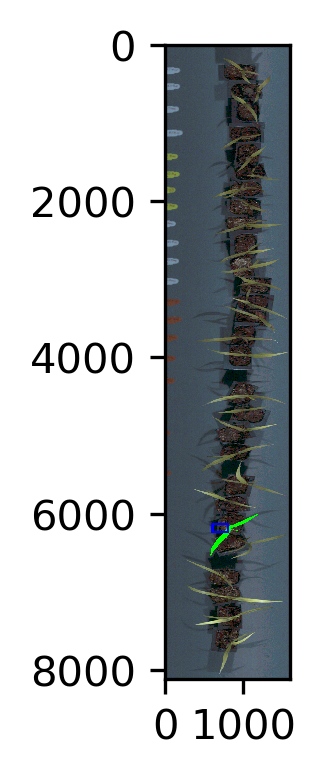

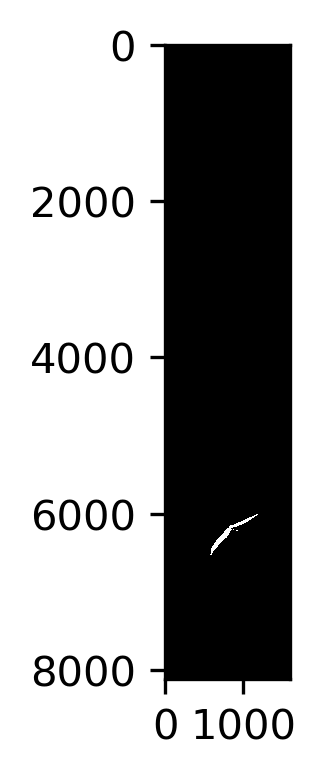

In [216]:
roi_objects_psent167_6_10_Q, hierarchy_psent167_6_10_Q, kept_mask_psent167_6_10_Q, obj_area_psent167_6_10_Q = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_Q,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_Q,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-14.835335, 95.3] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


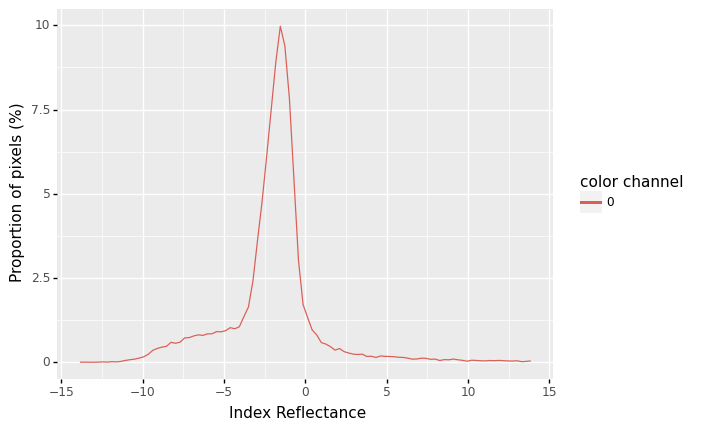

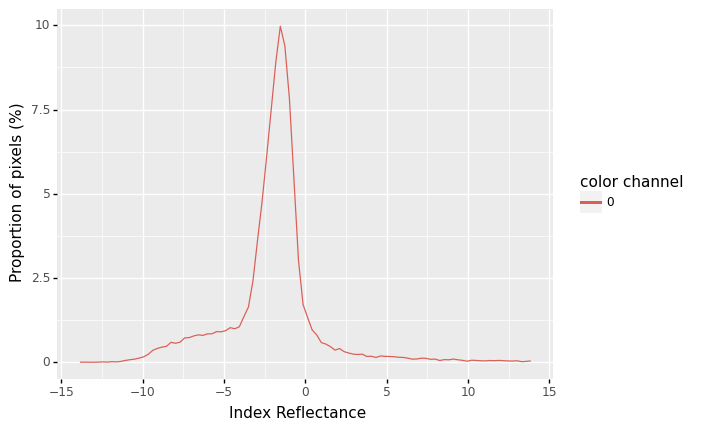

<ggplot: (2982799858237)>

In [217]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_Q, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [218]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DEX_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


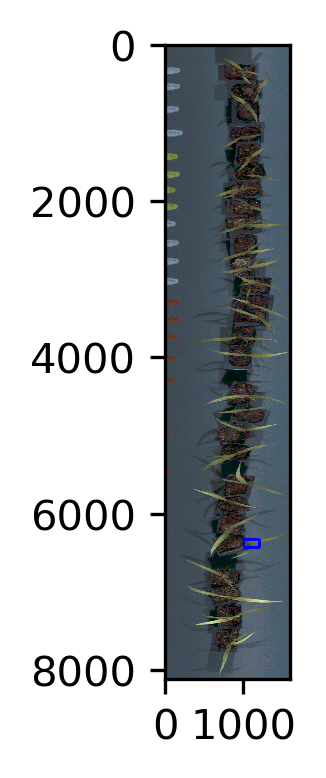

In [220]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_R, roi_hierarchy_psent167_6_10_R = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=1000, y=6330, h=100, w=200)

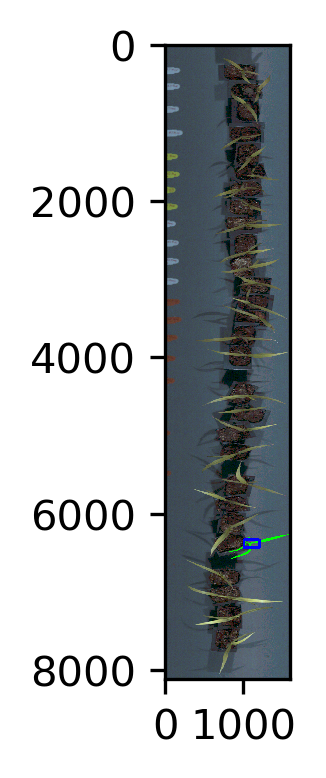

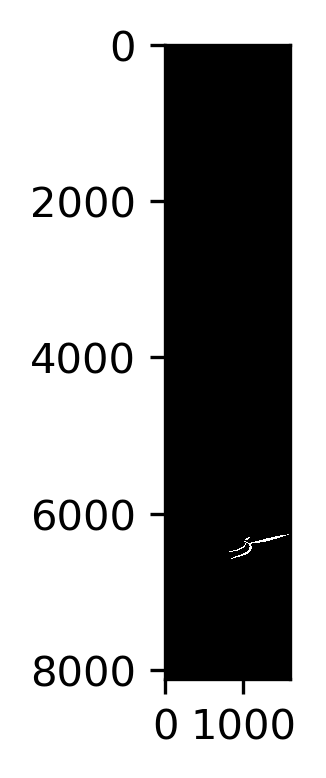

In [221]:
roi_objects_psent167_6_10_R, hierarchy_psent167_6_10_R, kept_mask_psent167_6_10_R, obj_area_psent167_6_10_R = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_R,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_R,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-16.464607, 45.859615] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


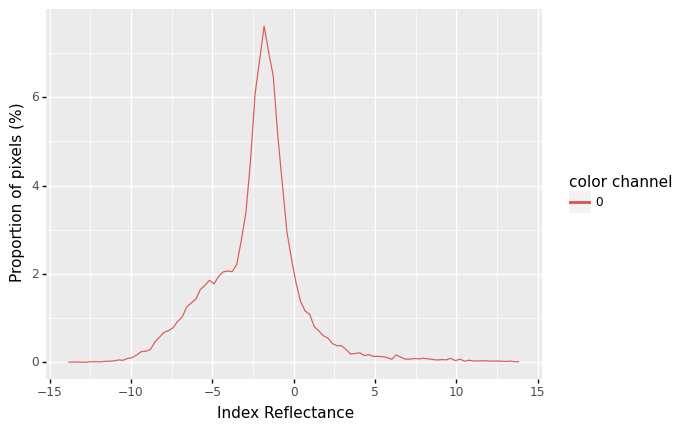

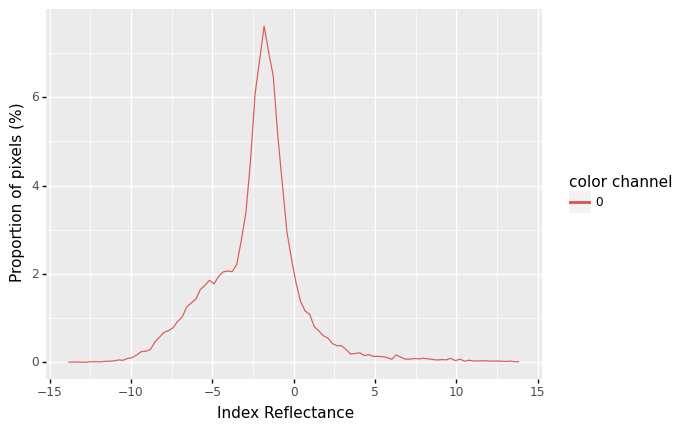

<ggplot: (2982799866097)>

In [222]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_R, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [223]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#6-7_1uM_DEX_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


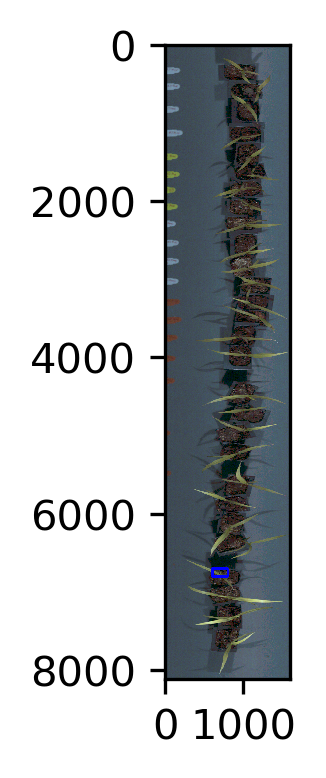

In [225]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_S, roi_hierarchy_psent167_6_10_S = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=600, y=6700, h=100, w=200)

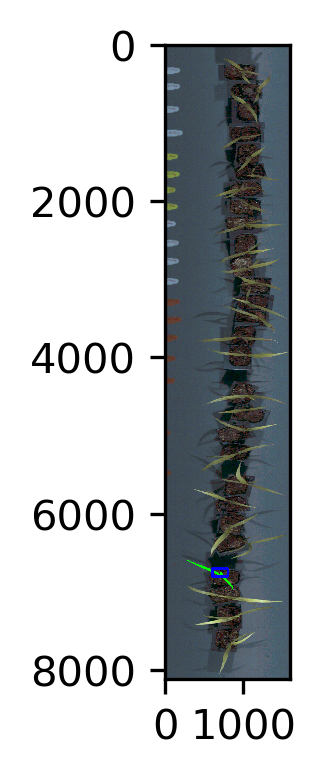

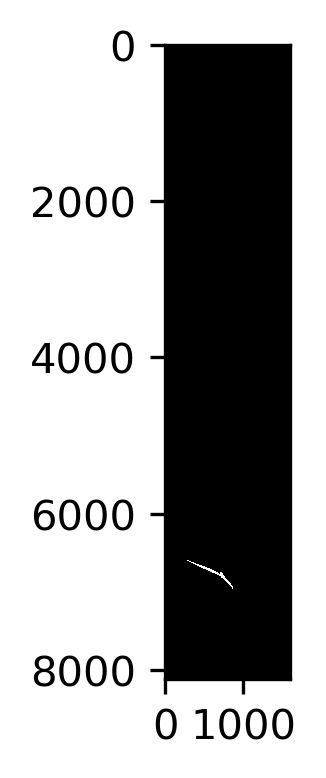

In [226]:
roi_objects_psent167_6_10_S, hierarchy_psent167_6_10_S, kept_mask_psent167_6_10_S, obj_area_psent167_6_10_S = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_S,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_S,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-19.388247, 41.163788] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


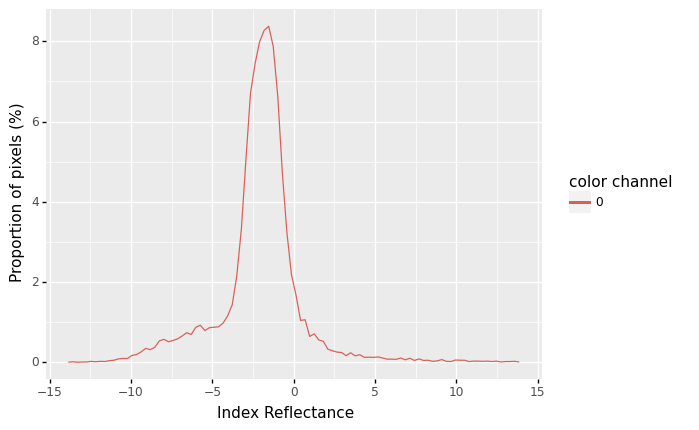

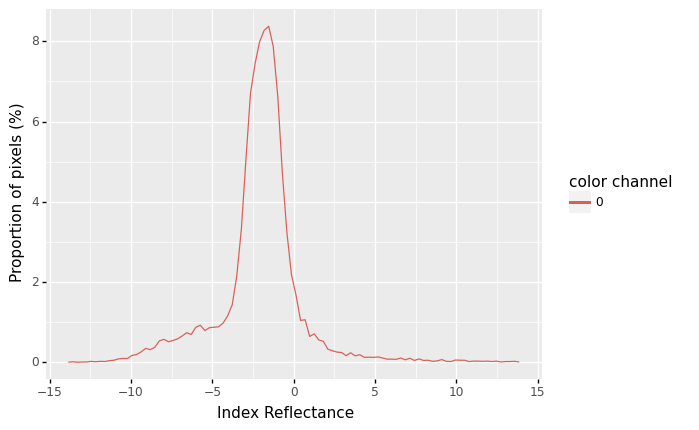

<ggplot: (2982799222349)>

In [227]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_S, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [228]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-10_1uM_TA_1.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


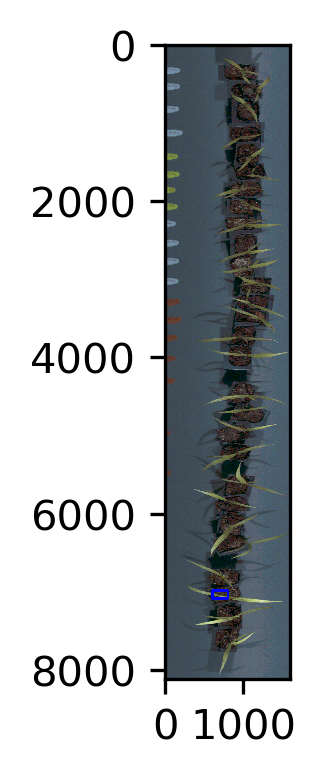

In [231]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_T, roi_hierarchy_psent167_6_10_T = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=600, y=6980, h=100, w=200)

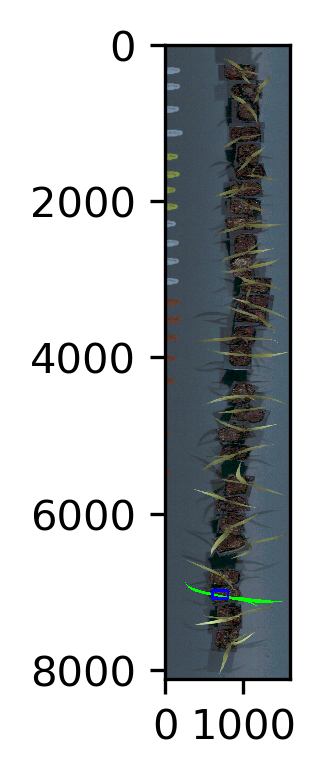

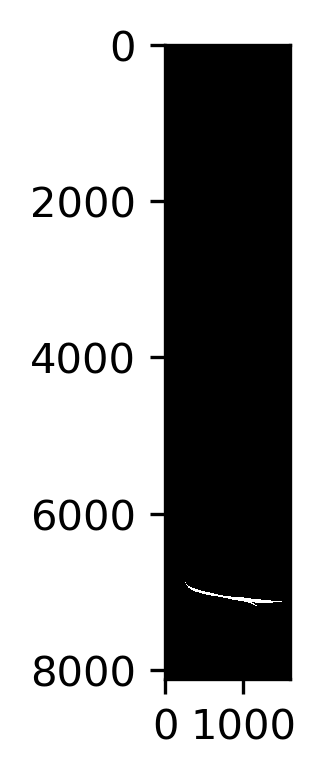

In [232]:
roi_objects_psent167_6_10_T, hierarchy_psent167_6_10_T, kept_mask_psent167_6_10_T, obj_area_psent167_6_10_T = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_T,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_T,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-14.680008, 75.42223] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


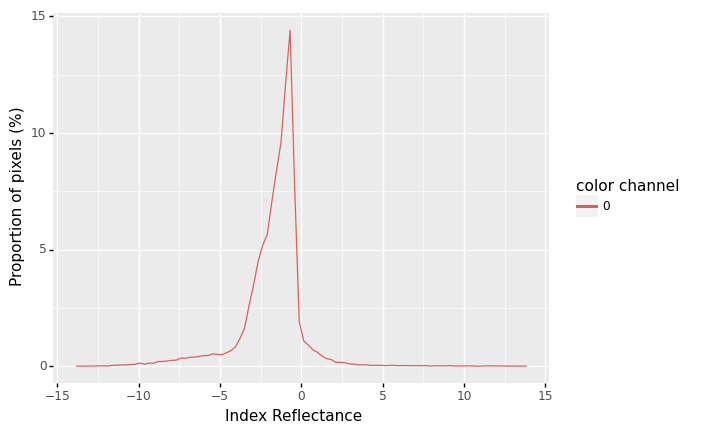

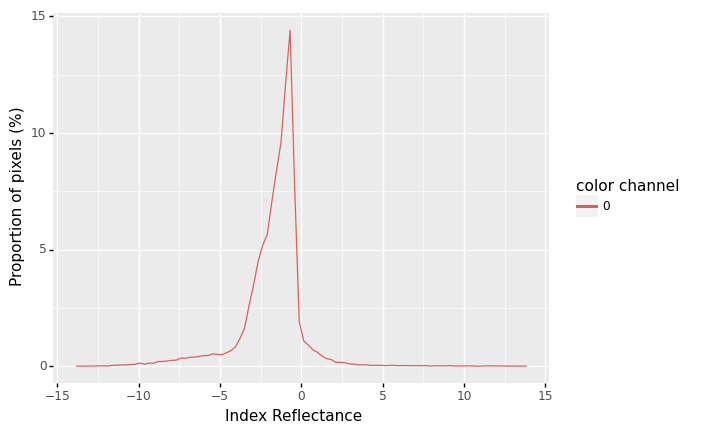

<ggplot: (2979626766745)>

In [233]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_T, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [234]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-10_1uM_TA_2.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


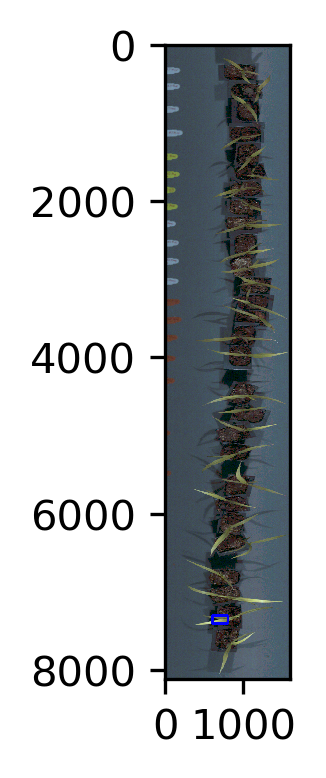

In [236]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_U, roi_hierarchy_psent167_6_10_U = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=600, y=7300, h=100, w=200)

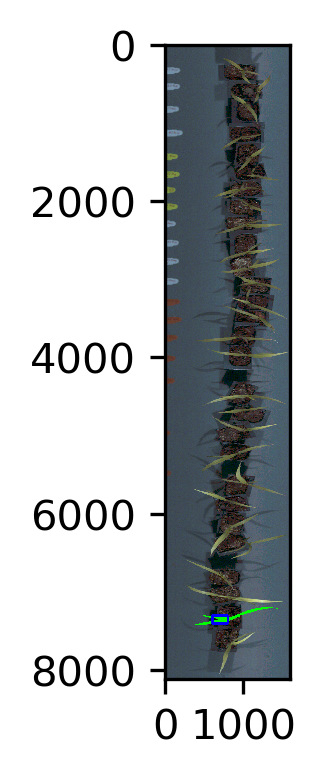

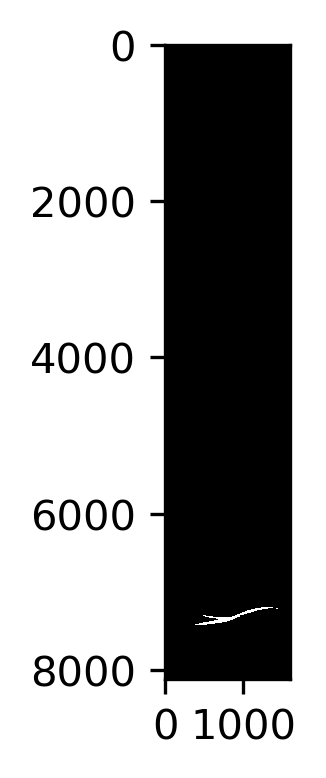

In [237]:
roi_objects_psent167_6_10_U, hierarchy_psent167_6_10_U, kept_mask_psent167_6_10_U, obj_area_psent167_6_10_U = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_U,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_U,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-15.475748, 70.97446] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


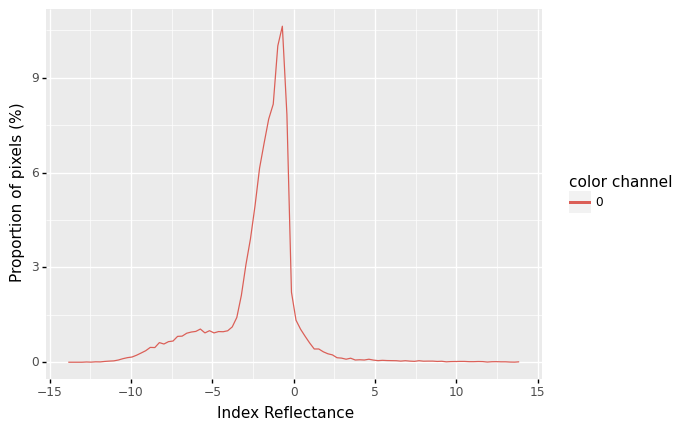

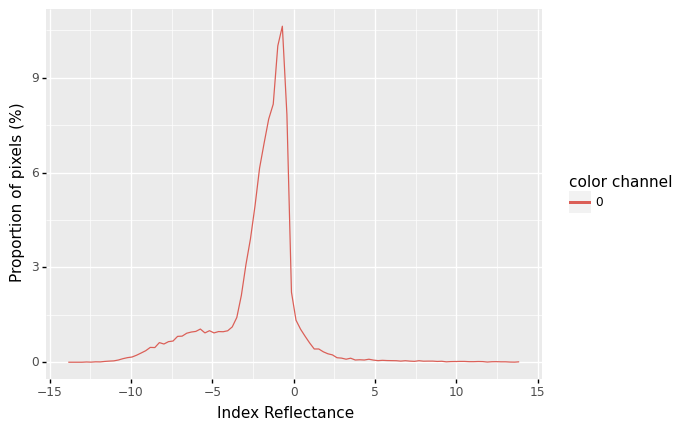

<ggplot: (2979636330837)>

In [238]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_U, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [239]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-10_1uM_TA_3.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          


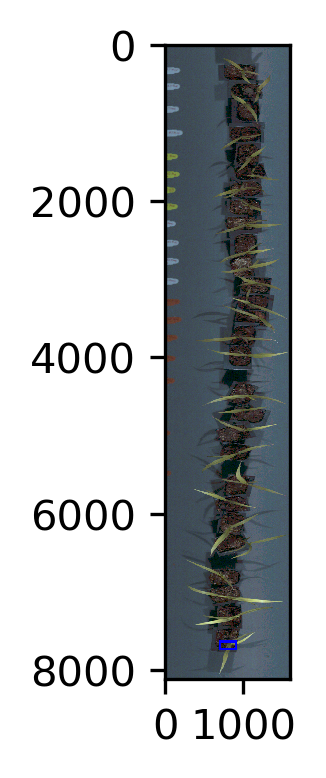

In [240]:
# Healthy mock leaf over the infiltration area
# Healthy mock leaf over the infiltration area

pcv.params.line_thickness = 30

roi_psent167_6_10_V, roi_hierarchy_psent167_6_10_V = pcv.roi.rectangle(img=psent_tray_1.pseudo_rgb, x=700, y=7630, h=100, w=200)

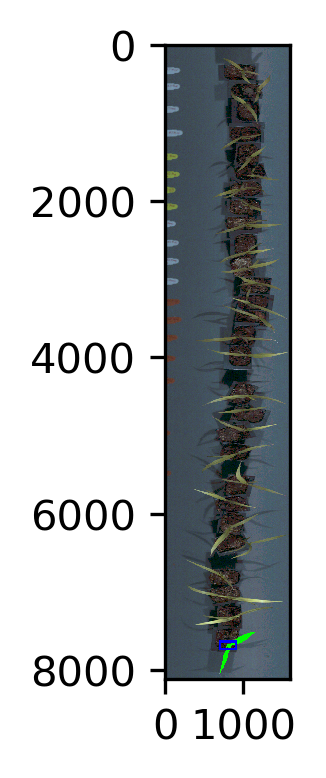

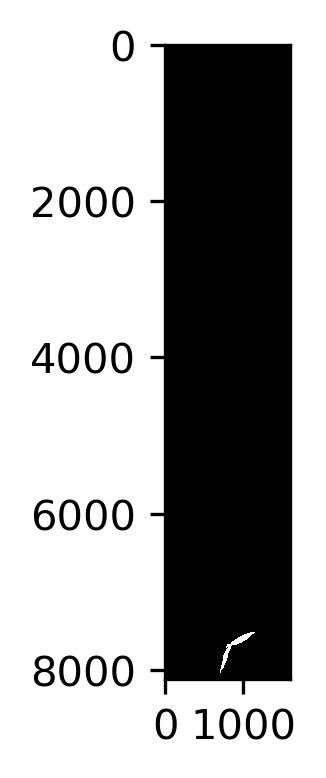

In [241]:
roi_objects_psent167_6_10_V, hierarchy_psent167_6_10_V, kept_mask_psent167_6_10_V, obj_area_psent167_6_10_V = pcv.roi_objects(img=psent_tray_1.pseudo_rgb,
                                                                                                                  roi_contour=roi_psent167_6_10_V,
                                                                                                                  roi_hierarchy=roi_hierarchy_psent167_6_10_V,
                                                                                                                  object_contour=id_objects,
                                                                                                                  obj_hierarchy=obj_hierarchy,
                                                                                                                  roi_type='partial')

WARNING!!! The observed range of pixel values in your masked index provided is [-14.594507, 371.34616] but the user defined range of bins for pixel frequencies is [-14, 14]. Adjust min_bin and max_bin in order to avoid cutting off data being collected.


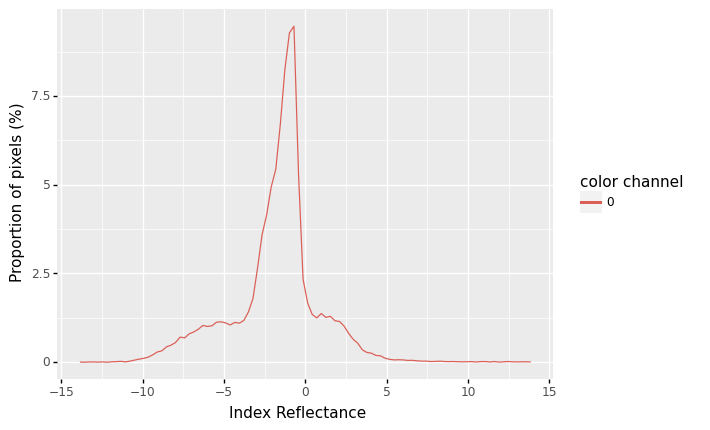

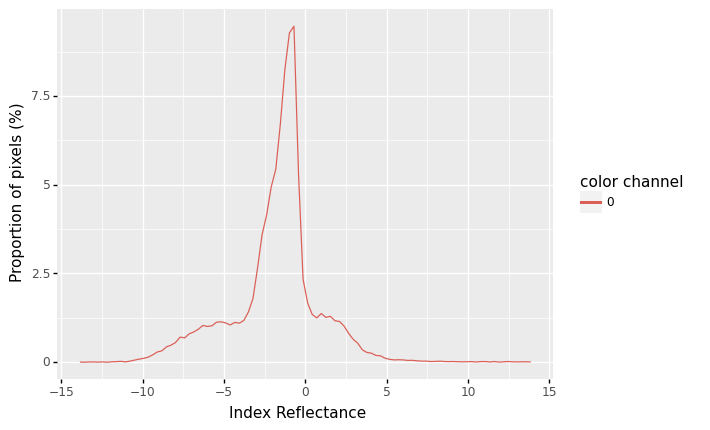

<ggplot: (2982799901061)>

In [242]:
pcv.outputs.clear()
pcv.params.debug='plot'

pcv.hyperspectral.analyze_index(index_array=ari_psent_tray_1, mask=kept_mask_psent167_6_10_V, histplot=True, bins=100, min_bin=-14, max_bin=14)

In [243]:
#Write spectral data to results file
pcv.print_results(filename='/shares/mgehan_share/lacosta-gamboa/darpa/anthocyanin/DEX_TA_DSP_setaria/#8-10_1uM_TA_4.txt')

Deprecation warning: plantcv.print_results will be removed in a future version.
             Please use plantcv.outputs.save_results instead.
          
